In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
import os
import tarfile
import json
import numpy as np
import nibabel as nib
import random
import glob
import seaborn as s
import warnings
from collections import Counter

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap, BoundaryNorm

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from scipy import ndimage
from scipy.ndimage import gaussian_filter, uniform_filter

In [ ]:
SEED= 1
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

# DATASET EXPLORATION



## Route configuration

In [ ]:
data_path = "/content/drive/MyDrive/Task01_BrainTumour"
tar_path = "/content/drive/MyDrive/Task01_BrainTumour.tar"

## Extract the dataset

In [ ]:
def extract_and_explore_archive(tar_path, data_path):
    if not os.path.exists(data_path):
        with tarfile.open(tar_path, 'r') as tar:
            tar.extractall(path=os.path.dirname(data_path))


# extract_and_explore_archive(tar_path, data_path)  # Uncomment to extract

## Analyze the JSON configuration file

In [ ]:
def analyze_dataset_json(data_path):

    # First test in the root directory, then look the subdirectories
    json_path = os.path.join(data_path, "dataset.json")

    if not os.path.exists(json_path):
        json_path = os.path.join(data_path, "Task01_BrainTumour", "dataset.json")

    if not os.path.exists(json_path):
        for root, dirs, files in os.walk(data_path):
            if "dataset.json" in files:
                json_path = os.path.join(root, "dataset.json")
                break

    if os.path.exists(json_path):
        with open(json_path, 'r') as f:
            config = json.load(f)

        print(f"   Dataset Name: {config.get('name', 'N/A')}")
        print(f"   Description: {config.get('description', 'N/A')}")
        print(f"   Available Modalities: {config.get('modality', 'N/A')}")
        print(f"   Labels: {config.get('labels', 'N/A')}")

        if 'training' in config:
            print(f"   Number of training cases: {len(config['training'])}")

        return config

dataset_config = analyze_dataset_json(data_path)

   Dataset Name: BRATS
   Description: Gliomas segmentation tumour and oedema in on brain images
   Available Modalities: {'0': 'FLAIR', '1': 'T1w', '2': 't1gd', '3': 'T2w'}
   Labels: {'0': 'background', '1': 'edema', '2': 'non-enhancing tumor', '3': 'enhancing tumour'}
   Number of training cases: 484



## FILE ANALYSIS

In [ ]:
def explore_single_case(data_path, case_info):
    print(f" In-depth analysis of the case: {case_info['image']}")

    # Correct data_path
    actual_data_path = os.path.join(data_path, "Task01_BrainTumour")

    # Check what is in the imagesTr directory.
    imagesTr_path = os.path.join(actual_data_path, 'imagesTr')

    if os.path.exists(imagesTr_path):
        files_in_imagesTr = os.listdir(imagesTr_path)[:10]  # first 10 files

    # variables initialization
    image_data = None
    mask_data = None

    # Upload image file
    image_relative_path = case_info['image'].lstrip('./')  # Remove the initial ./
    image_path = os.path.join(actual_data_path, image_relative_path)

    if os.path.exists(image_path):

        try:
            nifti_img = nib.load(image_path)
            image_data = nifti_img.get_fdata()

            print(f"   Immage dimension: {image_data.shape}")
            print(f"   Data Type: {image_data.dtype}")
            print(f"   Value Ranges: [{image_data.min():.2f}, {image_data.max():.2f}]")
            print(f"   Mean Value: {image_data.mean():.2f}")
            print(f"   Standard Deviation: {image_data.std():.2f}")

            # Analyze the fourth dimension (mode)
            if len(image_data.shape) == 4:
                print(f"   Number of modes: {image_data.shape[3]}")
                for i in range(image_data.shape[3]):
                    modality_data = image_data[:, :, :, i]
                    print(f"     Mode {i}: range [{modality_data.min():.2f}, {modality_data.max():.2f}], mean {modality_data.mean():.2f}")
        except Exception as e:
            print(f"   Error loading image: {e}")
    else:
        print("   Image file not found!")


    # Upload mask file
    label_relative_path = case_info['label'].lstrip('./') # Remove the initial ./
    mask_path = os.path.join(actual_data_path, label_relative_path)

    if os.path.exists(mask_path):
        try:
            mask_nifti = nib.load(mask_path)
            mask_data = mask_nifti.get_fdata()

            print(f"   Mask Dimentions: {mask_data.shape}")
            print(f"   Unique values in the mask: {np.unique(mask_data)}")

            # Count pixels for each class
            unique_values, counts = np.unique(mask_data, return_counts=True)
            total_pixels = mask_data.size
            print("   Class distribution:")
            for val, count in zip(unique_values, counts):
                percentage = (count / total_pixels) * 100
                print(f"     Class {int(val)}: {count} pixel ({percentage:.2f}%)")
        except Exception as e:
            print(f"   Error loading mask: {e}")
    else:
        print("   File mask not found!")

    return image_data, mask_data

# Analyze the first case
if dataset_config and 'training' in dataset_config:
    first_case = dataset_config['training'][0]
    sample_image, sample_mask = explore_single_case(data_path, first_case)

 In-depth analysis of the case: ./imagesTr/BRATS_457.nii.gz
   Immage dimension: (240, 240, 155, 4)
   Data Type: float64
   Value Ranges: [0.00, 1260.00]
   Mean Value: 60.20
   Standard Deviation: 149.74
   Number of modes: 4
     Mode 0: range [0.00, 939.00], mean 65.35
     Mode 1: range [0.00, 1260.00], mean 73.42
     Mode 2: range [0.00, 475.00], mean 20.19
     Mode 3: range [0.00, 965.00], mean 81.82
   Mask Dimentions: (240, 240, 155)
   Unique values in the mask: [0. 1. 2. 3.]
   Class distribution:
     Class 0: 8854209 pixel (99.17%)
     Class 1: 70526 pixel (0.79%)
     Class 2: 47 pixel (0.00%)
     Class 3: 3218 pixel (0.04%)


## VISUALIZATION AND UNDERSTANDING

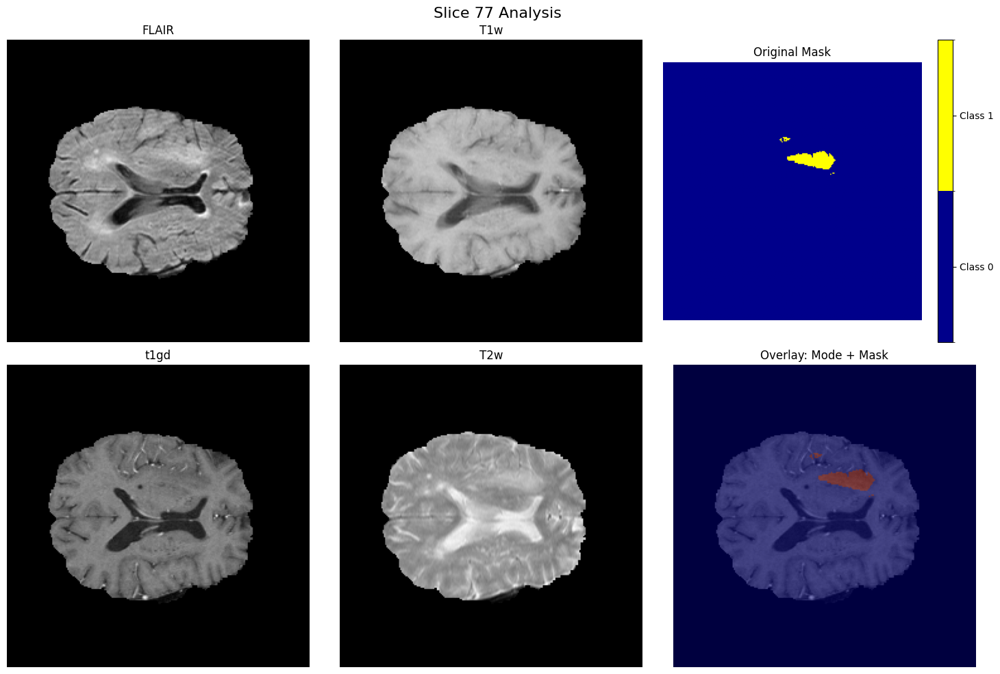

In [ ]:
def visualize_raw_data(image_data, mask_data, slice_idx=None):

    if slice_idx is None:
        # Find a slice with interesting content
        slice_idx = image_data.shape[2] // 2  # Start at the center
        for z in range(image_data.shape[2] // 2, image_data.shape[2]):
            if np.sum(mask_data[:, :, z]) > 100:  # Slice with enough annotations
                slice_idx = z
                break

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'Slice {slice_idx} Analysis ', fontsize=16)

    # View the 4 modes ({'0': 'FLAIR', '1': 'T1w', '2': 't1gd', '3': 'T2w'})
    modality_names = ['FLAIR', 'T1w', 't1gd', 'T2w']

    for i in range(4):
        row = i // 2
        col = i % 2

        slice_data = image_data[:, :, slice_idx, i]
        im = axes[row, col].imshow(slice_data, cmap='gray')
        axes[row, col].set_title(f'{modality_names[i]}')
        axes[row, col].axis('off')

    mask_slice = mask_data[:, :, slice_idx]
    unique_vals = np.unique(mask_slice)

    colors = ['darkblue', 'yellow', 'green', 'red']
    cmap = ListedColormap(colors[:len(unique_vals)])
    norm = BoundaryNorm(boundaries=np.arange(len(unique_vals)+1)-0.5, ncolors=len(unique_vals))

    im_mask = axes[0, 2].imshow(mask_slice, cmap=cmap, norm=norm)
    axes[0, 2].set_title('Original Mask')
    axes[0, 2].axis('off')

    cbar = plt.colorbar(im_mask, ax=axes[0, 2], ticks=unique_vals)
    cbar.ax.set_yticklabels([f'Class {int(v)}' for v in unique_vals])

    # Overlay
    axes[1, 2].imshow(image_data[:, :, slice_idx, 2], cmap='gray')
    axes[1, 2].imshow(mask_slice, cmap='jet', alpha=0.5)
    axes[1, 2].set_title('Overlay: Mode + Mask')
    axes[1, 2].axis('off')

    plt.tight_layout()
    plt.show()

    return slice_idx

if 'sample_image' in locals() and 'sample_mask' in locals():
    best_slice = visualize_raw_data(sample_image, sample_mask)

# NECESSARY FUNCTIONS

## 2D U-NET

In [ ]:
class UNet2D:
    def __init__(self, input_shape=(240, 240, 4), num_classes=4):
        # Input image size and number of output classes
        self.input_shape = input_shape
        self.num_classes = num_classes

    def conv_block(self, inputs, filters, kernel_size=3, activation='relu'):
        """
        A block with two convolutional layers, each followed by
        batch normalization and activation.
        """
        x = layers.Conv2D(filters, kernel_size, padding='same')(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Activation(activation)(x)

        x = layers.Conv2D(filters, kernel_size, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation(activation)(x)

        return x

    def encoder_block(self, inputs, filters):
        """
        Encoder block: apply conv_block and then downsample using MaxPooling.
        Returns both the conv output (for skip connection) and the pooled output.
        """
        conv = self.conv_block(inputs, filters)
        pool = layers.MaxPooling2D(pool_size=(2, 2))(conv)
        return conv, pool

    def decoder_block(self, inputs, skip_features, filters):
        """
        Decoder block: upsample the input, concatenate with skip connection,
        and apply conv_block.
        """
        upconv = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(inputs)
        concat = layers.Concatenate()([upconv, skip_features])  # Skip connection
        conv = self.conv_block(concat, filters)
        return conv

    def build_model(self):
        """
        Build the full U-Net model by stacking encoder blocks,
        a bottleneck, and decoder blocks.
        """
        inputs = layers.Input(shape=self.input_shape)

        # Encoder: downsampling path
        s1, p1 = self.encoder_block(inputs, 64)    # First encoder block
        s2, p2 = self.encoder_block(p1, 128)        # Second encoder block
        s3, p3 = self.encoder_block(p2, 256)        # Third encoder block
        s4, p4 = self.encoder_block(p3, 512)        # Fourth encoder block

        # Bottleneck
        bottleneck = self.conv_block(p4, 1024)

        # Decoder: upsampling path
        d1 = self.decoder_block(bottleneck, s4, 512)   # First decoder block
        d2 = self.decoder_block(d1, s3, 256)           # Second decoder block
        d3 = self.decoder_block(d2, s2, 128)           # Third decoder block
        d4 = self.decoder_block(d3, s1, 64)            # Fourth decoder block

        # Output layer: final prediction with softmax for multi-class segmentation
        outputs = layers.Conv2D(self.num_classes, 1, activation='softmax')(d4)

        # Create the model
        model = keras.Model(inputs, outputs, name='UNet2D')
        return model

## DICE LOSS

In [ ]:
class DiceLoss(keras.losses.Loss):
    """Dice Loss implementation for segmentation tasks"""

    def __init__(self, smooth=1e-6, name='dice_loss'):
        # Call the parent class constructor with the given name
        super().__init__(name=name)
        # Addition of a small smoothing factor to avoid division by zero
        self.smooth = smooth

    def call(self, y_true, y_pred):
        """
        Computes the Dice Loss between the ground truth and predicted masks.
        Returns Dice loss
        """

        # Convert ground truth labels to one-hot format (shape: [batch, height, width, 4])
        y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=4)

        # Flatten both the ground truth and predicted masks to shape: [total_pixels, 4]
        y_true_flat = tf.reshape(y_true_one_hot, [-1, 4])
        y_pred_flat = tf.reshape(y_pred, [-1, 4])

        # Compute the intersection for each class (element-wise multiplication and sum)
        intersection = tf.reduce_sum(y_true_flat * y_pred_flat, axis=0)

        # Compute the union for each class (sum of both masks)
        union = tf.reduce_sum(y_true_flat, axis=0) + tf.reduce_sum(y_pred_flat, axis=0)

        # Calculate Dice coefficient for each class using the formula
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Dice loss is 1 - mean Dice coefficient across all classes
        return 1.0 - tf.reduce_mean(dice)


## DICE SCORE

In [ ]:
class DiceScore(keras.metrics.Metric):
    """Dice Score metric"""

    def __init__(self, num_classes=4, name='dice_score', **kwargs):
        # Call the parent constructor
        super().__init__(name=name, **kwargs)
        self.num_classes = num_classes

        # Create a variable to accumulate Dice scores for each class
        self.dice_scores = self.add_weight(
            name='dice_scores', shape=(num_classes,), initializer='zeros'
        )

        # Counter to keep track of how many batches we've seen
        self.count = self.add_weight(name='count', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        """Updates the metric state using a new batch of data"""

        # Convert ground truth to one-hot encoding
        y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=self.num_classes)

        # Convert predicted probabilities to predicted class labels, then to one-hot
        y_pred_argmax = tf.keras.utils.to_categorical(
            tf.argmax(y_pred, axis=-1), num_classes=self.num_classes
        )

        # Flatten both tensors to shape: [total_pixels, num_classes]
        y_true_flat = tf.reshape(y_true_one_hot, [-1, self.num_classes])
        y_pred_flat = tf.reshape(y_pred_argmax, [-1, self.num_classes])

        # Calculate intersection and union per class
        intersection = tf.reduce_sum(y_true_flat * y_pred_flat, axis=0)
        union = tf.reduce_sum(y_true_flat, axis=0) + tf.reduce_sum(y_pred_flat, axis=0)

        # Compute Dice coefficient for each class
        dice = (2.0 * intersection + 1e-6) / (union + 1e-6)

        # Accumulate Dice scores and increment batch count
        self.dice_scores.assign_add(dice)
        self.count.assign_add(1.0)

    def result(self):
        """
        Returns the average Dice score across all batches and classes.
        """
        return tf.reduce_mean(self.dice_scores / self.count)

    def reset_state(self):
        """
        Resets the metric state (to start a new evaluation from scratch).
        """
        self.dice_scores.assign(tf.zeros((self.num_classes,)))
        self.count.assign(0.0)


## SPLIT TRAINING AND VALIDATION

In [ ]:
def preprocess_mask(mask):
    processed_mask = np.zeros_like(mask)
    processed_mask[mask == 1] = 1
    processed_mask[mask == 2] = 2
    processed_mask[mask == 4] = 3
    return processed_mask.astype(np.uint8)

def get_cases_to_process(dataset_config, max_cases=None, random_state=None, split_key="training", data_path=None):

    if split_key not in dataset_config:
        raise ValueError(f"The key '{split_key}' isn't present into the dataset_config.")

    cases_to_process = dataset_config[split_key].copy()

    if random_state is not None:
        rng = random.Random(random_state)
        rng.shuffle(cases_to_process)

    if max_cases:
        cases_to_process = cases_to_process[:max_cases]

    return cases_to_process

In [ ]:
correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"
patients_to_process = get_cases_to_process(dataset_config, max_cases=10, random_state=13, data_path=correct_data_path)

In [ ]:
patients_to_process = sorted(
    patients_to_process,
    key=lambda x: x['image']
)
train_patients, val_patients = train_test_split(
    patients_to_process, test_size=0.2, random_state=13
    )
train_ids = [p['image'].split('/')[-1].replace('.nii.gz', '') for p in train_patients]
valid_ids = [p['image'].split('/')[-1].replace('.nii.gz', '') for p in val_patients]

print(f"Total patients: {len(patients_to_process)}")
print(f"Training patients: {len(train_patients)}")
print(f"Validation patients: {len(val_patients)}")

print("Train:", train_ids)
print("Validation:", valid_ids)

Total patients: 10
Training patients: 8
Validation patients: 2
Train: ['BRATS_137', 'BRATS_046', 'BRATS_108', 'BRATS_178', 'BRATS_207', 'BRATS_315', 'BRATS_037', 'BRATS_056']
Validation: ['BRATS_096', 'BRATS_130']


## VISUALIZE PATIENT INFO

In [ ]:
def visualize_with_patient_info(images, masks, slice_info, sample_idx=None,
                                show_crop_info=True, show_dataset_index=True):
  """Displays a specific brain slice with full patient and slice information"""
  if len(images) == 0:
    print("No image to display")
    return

  if sample_idx is None:
    sample_idx = len(images) // 2

  # Extract metadata for the selected slice
  info = slice_info[sample_idx]
  patient_id = info.get('patient_id', 'Unknown')
  original_slice_idx = info.get('original_slice_idx', '?')
  total_slices = info.get('total_slices', '?')

  if show_dataset_index:
      print("\n---------------------")
      print("Visualize a specific brain slice after preprocessing")
      print(f"Patient: {patient_id}")
      print(f"Index in the processed dataset: {sample_idx}/{len(images)}")

  # Info about cropping (if exist)
  crop_info = info.get('crop_info')
  if show_crop_info and crop_info:
      print(f"\n INFO BRAIN CROPPING:")
      print(f"  Original dimension: {crop_info['original_size']}")
      print(f"  Dimension after cropping: {crop_info['cropped_size']}")
      print(f"  Background reduction: {(1 - crop_info['reduction_factor']) * 100:.1f}%")

  # Main title
  title = f"Patient: {patient_id} - Slice {original_slice_idx}/{total_slices}"
  if crop_info and show_crop_info and crop_info['reduction_factor'] < 1.0:
      title += f" (Background reducted of {(1 - crop_info['reduction_factor']) * 100:.1f}%)"

  # Setup figure
  fig, axes = plt.subplots(2, 3, figsize=(15, 10))
  fig.suptitle(title, fontsize=16)

  modality_names = ['FLAIR', 'T1w', 'T1gd', 'T2w']

  for i in range(4):
      row, col = divmod(i, 2)
      axes[row, col].imshow(images[sample_idx, :, :, i], cmap='gray')
      axes[row, col].set_title(f'{modality_names[i]} (Processed)')
      axes[row, col].axis('off')

  # Maschera
  axes[0, 2].imshow(masks[sample_idx], cmap='jet')
  axes[0, 2].set_title('Final Mask')
  axes[0, 2].axis('off')

  # Overlay
  axes[1, 2].imshow(images[sample_idx, :, :, 2], cmap='gray')
  axes[1, 2].imshow(masks[sample_idx], cmap='jet', alpha=0.5)
  axes[1, 2].set_title('Final Overlay')
  axes[1, 2].axis('off')

  plt.tight_layout()
  plt.show()


## LOAD FUNCTIONS


In [ ]:
def split_and_analyze_dataset(
    images, masks, slice_info,
    test_size=0.2, seed=13, label="",
    visualize=False):

    # Visualizzazione opzionale
    if visualize and len(images) > 0:
        visualize_with_patient_info(images, masks, slice_info)

    # Estrai ID pazienti
    unique_patients = sorted(list(set(info['patient_id'] for info in slice_info)))
    train_patients, val_patients = train_test_split(unique_patients, test_size=test_size, random_state=seed)

    # Ricava indici
    train_indices = [i for i, info in enumerate(slice_info) if info['patient_id'] in train_patients]
    val_indices = [i for i, info in enumerate(slice_info) if info['patient_id'] in val_patients]

    # Dataset split
    X_train = images[train_indices]
    y_train = masks[train_indices]
    X_val = images[val_indices]
    y_val = masks[val_indices]

    train_slice_info = [slice_info[i] for i in train_indices]
    val_slice_info = [slice_info[i] for i in val_indices]

    # Stampa distribuzione classi
    def print_class_distribution(y_data, set_name):
        class_counts = np.bincount(y_data.flatten().astype(int))
        print(f"{set_name} set - pixel per class:")
        for i, count in enumerate(class_counts):
            if count > 0:
                print(f"  Class {i}: {count:,} pixel ({count / np.sum(class_counts) * 100:.1f}%)")

    # Riduzione del background se disponibile
    def print_cropping_stats(indices, set_name):
        if 'crop_info' in slice_info[0]:
            reductions = [slice_info[i]['crop_info']['reduction_factor'] for i in indices]
            print(f"{set_name} set - background average reduction: {(1 - np.mean(reductions)) * 100:.1f}%")

    # Output finale
    print(f"\n==== {label.upper()} ====")
    print_class_distribution(y_train, "Training")
    print_class_distribution(y_val, "Validation")
    print_cropping_stats(train_indices, "Training")
    print_cropping_stats(val_indices, "Validation")

    return X_train, y_train, X_val, y_val, train_slice_info, val_slice_info



## TRAINING MODEL FUNCTION

In [ ]:
class BraTSTrainer:
    def __init__(self, model, train_data, val_data, model_name=None):
        # Store the model and split the training and validation data
        self.model = model
        self.X_train, self.y_train = train_data
        self.X_val, self.y_val = val_data
        self.history = None  # This will store the training history
        self.model_name = model_name  # e.g. "model_crop.keras"
        self.save_path = f"/content/drive/MyDrive/{self.model_name}"

    def compile_model(self, learning_rate=1e-4):
        """Compile the model with appropriate loss function and metrics"""
        optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

        self.model.compile(
            optimizer=optimizer,
            loss=DiceLoss(),
            metrics=['accuracy', DiceScore()]
        )

    def train(self, epochs=50, batch_size=8, patience=10):
        """Train the model using early stopping and checkpoints"""
        callbacks = [
            keras.callbacks.EarlyStopping(
                patience=patience,
                restore_best_weights=True,
                monitor='val_loss'
            ),
            keras.callbacks.ReduceLROnPlateau(
                factor=0.5,
                patience=5,
                min_lr=1e-7,
                monitor='val_loss'
            ),
            keras.callbacks.ModelCheckpoint(
                filepath=self.save_path,
                save_best_only=True,
                monitor='val_dice_score',
                mode='max'
            )
        ]

        self.history = self.model.fit(
            self.X_train, self.y_train,
            batch_size=batch_size,
            epochs=epochs,
            validation_data=(self.X_val, self.y_val),
            callbacks=callbacks,
            verbose=1
        )

        # Save the final model
        self.model.save(self.save_path)
        print(f"Model saved at {self.save_path}")

    def plot_training_history(self):
        """Plot training and validation performance over time"""
        if self.history is None:
            return

        fig, axes = plt.subplots(2, 2, figsize=(15, 10))

        # Plot loss
        axes[0, 0].plot(self.history.history['loss'], label='Training Loss')
        axes[0, 0].plot(self.history.history['val_loss'], label='Validation Loss')
        axes[0, 0].set_title('Model Loss')
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()

        # Plot accuracy
        axes[0, 1].plot(self.history.history['accuracy'], label='Training Accuracy')
        axes[0, 1].plot(self.history.history['val_accuracy'], label='Validation Accuracy')
        axes[0, 1].set_title('Model Accuracy')
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Accuracy')
        axes[0, 1].legend()

        # Plot Dice Score
        axes[1, 0].plot(self.history.history['dice_score'], label='Training Dice Score')
        axes[1, 0].plot(self.history.history['val_dice_score'], label='Validation Dice Score')
        axes[1, 0].set_title('Dice Score')
        axes[1, 0].set_xlabel('Epoch')
        axes[1, 0].set_ylabel('Dice Score')
        axes[1, 0].legend()

        # Plot learning rate
        if 'lr' in self.history.history:
            axes[1, 1].plot(self.history.history['lr'])
            axes[1, 1].set_title('Learning Rate')
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].set_ylabel('Learning Rate')
            axes[1, 1].set_yscale('log')

        plt.tight_layout()
        plt.show()


    def predict_and_visualize(self, num_samples=5):
        """Make predictions on validation data and show the results"""
        # Randomly select sample indices from the validation set
        indices = np.random.choice(len(self.X_val), num_samples, replace=False)

        for i, idx in enumerate(indices):
            # Get a single image and expand its dimensions to batch size 1
            x_sample = np.expand_dims(self.X_val[idx], axis=0)

            # Segmentation map prediction
            y_pred = self.model.predict(x_sample)
            y_pred_class = np.argmax(y_pred[0], axis=-1)  # Convert softmax to class labels

            # Plot the image, ground truth, prediction, and overlay
            fig, axes = plt.subplots(1, 4, figsize=(20, 5))

            # Show the T1gd (3rd channel) input image
            axes[0].imshow(self.X_val[idx, :, :, 2], cmap='gray')
            axes[0].set_title('T1gd')
            axes[0].axis('off')

            # Show the ground truth mask
            axes[1].imshow(self.y_val[idx], cmap='jet')
            axes[1].set_title('Ground Truth')
            axes[1].axis('off')

            # Show the predicted mask
            axes[2].imshow(y_pred_class, cmap='jet')
            axes[2].set_title('Prediction')
            axes[2].axis('off')

            # Overlay the prediction on top of the original image
            axes[3].imshow(self.X_val[idx, :, :, 2], cmap='gray')
            axes[3].imshow(y_pred_class, cmap='jet', alpha=0.5)
            axes[3].set_title('Overlay')
            axes[3].axis('off')

            plt.suptitle(f'Sample {i+1}')
            plt.tight_layout()
            plt.show()


In [ ]:
def main_training(X_train, y_train, X_val, y_val,
                  model_class, model_kwargs=None,
                  model_name=None, seed=None):
    def set_seed(seed):
        os.environ['PYTHONHASHSEED'] = str(seed)
        os.environ['TF_DETERMINISTIC_OPS'] = '1'
        random.seed(seed)
        np.random.seed(seed)
        tf.random.set_seed(seed)

    if seed is not None:
        set_seed(seed)

    model_kwargs = model_kwargs or {}

    # Build the model by passing parameters to the chosen class
    model_builder = model_class(**model_kwargs)
    model = model_builder.build_model()
    model.summary()

    # Define BraTSTrainer's parameters
    trainer = BraTSTrainer(
        model=model,
        train_data=(X_train, y_train),
        val_data=(X_val, y_val),
        model_name=model_name
    )

    trainer.compile_model(learning_rate=1e-4)
    trainer.train(epochs=10, batch_size=4, patience=10)
    trainer.plot_training_history()
    trainer.predict_and_visualize(num_samples=3)

    return model, trainer

# DATA LEAKAGE PROBLEM

## Data Loader Class

In [ ]:
class BraTSDataLoader:
    def __init__(self, data_path, img_size=(240, 240)):
        self.data_path = data_path
        self.img_size = img_size
        self.cases = []

# Loading Functions and Data Preprocessing
    def load_nifti_file(self, filepath):
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()
        if data.std() != 0:
            data = (data - data.mean()) / data.std()
        return data

    def prepare_case(self, case_info):
        base_path = os.path.join(self.data_path, "Task01_BrainTumour")
        image_path = os.path.join(base_path, case_info['image'])
        image_4d = self.load_nifti_file(image_path)
        mask_path = os.path.join(base_path, case_info['label'])
        mask = nib.load(mask_path).get_fdata()
        modalities = {
        '0000': image_4d[:, :, :, 0],  # FLAIR
        '0001': image_4d[:, :, :, 1],  # T1w
        '0002': image_4d[:, :, :, 2],  # T1gd
        '0003': image_4d[:, :, :, 3],  # T2w
        }

        return modalities, mask

# Masks Preprocessing and 2D Slicing
    def extract_2d_slices(self, modalities, mask):
        volume = np.stack([
            modalities['0000'],  # FLAIR
            modalities['0001'],  # T1w
            modalities['0002'],  # T1gd
            modalities['0003']   # T2w
        ], axis=-1)

        slices_data = []
        slices_masks = []
        for z in range(volume.shape[2]):
            slice_img = volume[:, :, z, :]
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:
                slice_img_resized = tf.image.resize(slice_img, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(
                    np.expand_dims(slice_mask, -1),
                    self.img_size,
                    method='nearest'
                ).numpy().squeeze()
                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

        return np.array(slices_data), np.array(slices_masks)

# Dataset Preparation and Visualization
    def prepare_dataset(self, patients_to_process = patients_to_process):
        print("\n")
        all_images = []
        all_masks = []

        cases_to_process = patients_to_process.copy()

        for i, case in enumerate(cases_to_process):
            print(f"Processing case {i+1}/{len(cases_to_process)}: {case['image']}")
            try:
                modalities, mask = self.prepare_case(case)
                processed_mask = preprocess_mask(mask)
                slices_data, slices_masks = self.extract_2d_slices(modalities, processed_mask)
                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
            except Exception as e:
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)
        print(f"Dataset prepared: {all_images.shape[0]} slice")
        print(f"Shape of Images: {all_images.shape}")
        print(f"Shape of masks: {all_masks.shape}")
        return all_images, all_masks

# Loader inizialization
loader = BraTSDataLoader(data_path)

images, masks = loader.prepare_dataset()



Processing case 1/10: ./imagesTr/BRATS_037.nii.gz
Processing case 2/10: ./imagesTr/BRATS_046.nii.gz
Processing case 3/10: ./imagesTr/BRATS_056.nii.gz
Processing case 4/10: ./imagesTr/BRATS_096.nii.gz
Processing case 5/10: ./imagesTr/BRATS_108.nii.gz
Processing case 6/10: ./imagesTr/BRATS_130.nii.gz
Processing case 7/10: ./imagesTr/BRATS_137.nii.gz
Processing case 8/10: ./imagesTr/BRATS_178.nii.gz
Processing case 9/10: ./imagesTr/BRATS_207.nii.gz
Processing case 10/10: ./imagesTr/BRATS_315.nii.gz
Dataset prepared: 716 slice
Shape of Images: (716, 240, 240, 4)
Shape of masks: (716, 240, 240)


## Training function

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(
    images, masks, test_size=0.2, random_state=42
)

print(f"Training set: {X_train.shape}")
print(f"Validation set: {X_val.shape}")

Training set: (572, 240, 240, 4)
Validation set: (144, 240, 240, 4)


Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 240, 240,  │      2,368 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 240, 240,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 240, 240,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 120, 120,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 120, 120,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 120, 120,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 60, 60,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 60, 60,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_4[0][0]  

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 94s 529ms/step - accuracy: 0.7823 - dice_score: 0.2900 - loss: 0.7781 - val_accuracy: 0.7861 - val_dice_score: 0.2510 - val_loss: 0.7834 - learning_rate: 1.0000e-04
Epoch 2/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 67s 438ms/step - accuracy: 0.9120 - dice_score: 0.4873 - loss: 0.6690 - val_accuracy: 0.9401 - val_dice_score: 0.3750 - val_loss: 0.6901 - learning_rate: 1.0000e-04
Epoch 3/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 81s 432ms/step - accuracy: 0.9426 - dice_score: 0.5604 - loss: 0.6236 - val_accuracy: 0.9669 - val_dice_score: 0.5609 - val_loss: 0.6239 - learning_rate: 1.0000e-04
Epoch 4/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 57s 401ms/step - accuracy: 0.9836 - dice_score: 0.5353 - loss: 0.5731 - val_accuracy: 0.9865 - val_dice_score: 0.5446 - val_loss: 0.5612 - learning_rate: 1.0000e-04
Epoch 5/10
143/143 ━━━━━━━━━━━━━━━━━━━━ 93s 482ms/step - accuracy: 0.9865 - dice_score: 0.6786 - loss: 0.5267 - val_accuracy: 0.9873 - val_dice_score: 0.6074 - val_loss: 0.5325 - l

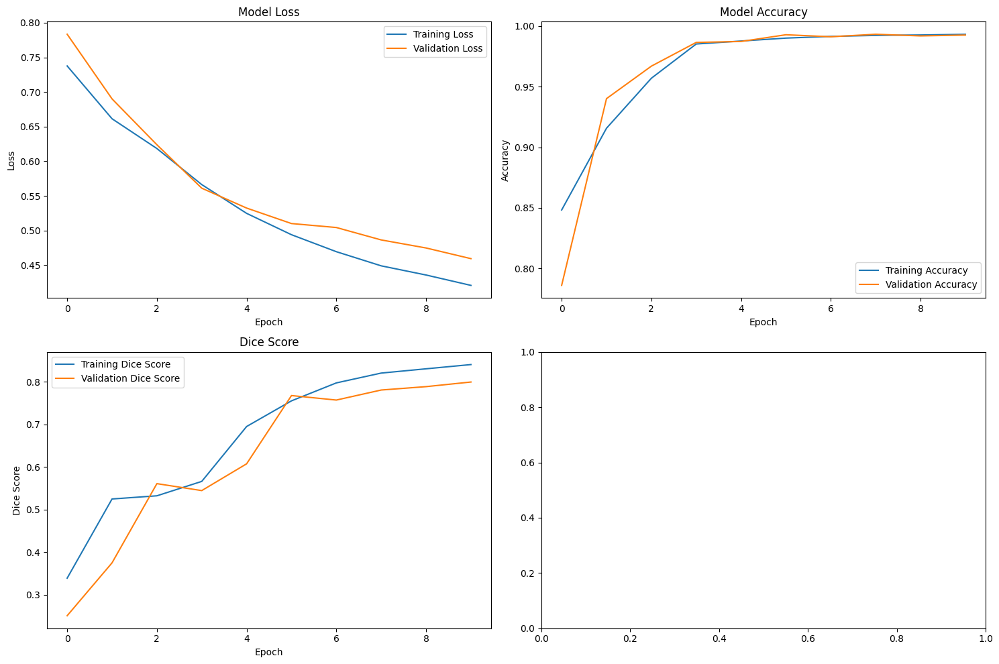

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step


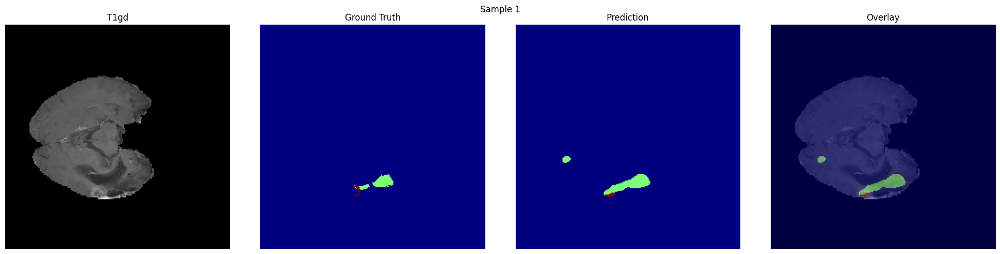

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


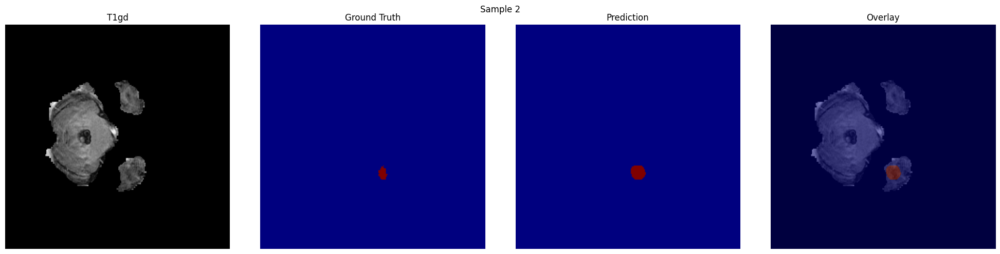

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


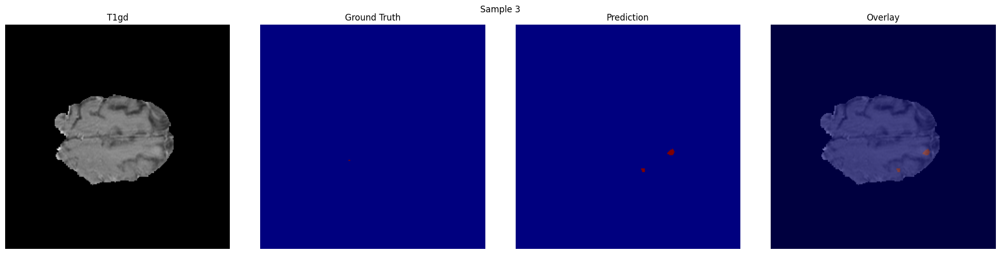

In [ ]:
model_leakage, trainer_leakage = main_training(
    X_train, y_train, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_data_leakage.keras",
    seed=13
)

# DATA LEAKAGE SOLVED

## Data Loader Class

In [ ]:
class BraTSDataLoaderDiscoveredWithTracking:
    """
    Class developed based on exploratory analysis of the BraTS dataset.
    Tracks patient ID and slice index for each image.
    """

    def __init__(self, data_path, img_size=(240, 240)):
        # Fix the path if needed
        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path

        self.img_size = img_size

    def load_nifti_file(self, filepath):
        """Load and normalize NIfTI files based on dataset analysis."""
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()

        # Data Normalization
        if data.std() != 0:
            data = (data - data.mean()) / data.std()

        return data

    def extract_meaningful_slices_with_info(self, image_4d, mask, patient_id):
        """
        Extract only the slices that contain tumor annotations.
        Keep track of patient and slice index information.
        """
        # Separate the 4 image modalities
        modalities = {
            'FLAIR': image_4d[:, :, :, 0],
            'T1w': image_4d[:, :, :, 1],
            'T1gd': image_4d[:, :, :, 2],
            'T2w': image_4d[:, :, :, 3]
        }

        # Combine modalities into a single volume (H, W, Z, Channels)
        volume = np.stack([
            modalities['FLAIR'],
            modalities['T1w'],
            modalities['T1gd'],
            modalities['T2w']
        ], axis=-1)

        slices_data = []
        slices_masks = []
        slice_info = []

        for z in range(volume.shape[2]):  # Loop through slices along Z-axis
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:  # Process only non-empty masks
                slice_img = volume[:, :, z, :]

                # Resize the image and mask to the target size
                slice_img_resized = tf.image.resize(slice_img, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(
                    np.expand_dims(slice_mask, -1),
                    self.img_size,
                    method='nearest'  # Preserve label values
                ).numpy().squeeze()

                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

                # Store metadata about the slice
                slice_info.append({
                    'patient_id': patient_id,
                    'original_slice_idx': z,
                    'total_slices': volume.shape[2],
                    'tumor_pixels': np.sum(slice_mask > 0)
                })

        return np.array(slices_data), np.array(slices_masks), slice_info

    def process_discovered_dataset_with_tracking(self, patients_to_process = patients_to_process):
        """
        Process the dataset using the discovered insights.
        Keep track of which patient and slice each image comes from.
        """

        all_images = []
        all_masks = []
        all_slice_info = []

        cases_to_process = patients_to_process.copy()

        for i, case in enumerate(cases_to_process):
            patient_id = os.path.basename(case['image']).replace('.nii.gz', '')
            print(f"\nProcessing case {i+1}/{len(cases_to_process)}: {patient_id}")

            try:
                # Clean the image path
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                if not os.path.exists(image_path):
                    print(f"  Image file not found: {image_path}")
                    continue

                # Load the 4D image volume
                image_4d = self.load_nifti_file(image_path)

                # Clean the mask path
                label_relative_path = case['label'].lstrip('./')
                mask_path = os.path.join(self.data_path, label_relative_path)

                if not os.path.exists(mask_path):
                    print(f"  Mask file not found: {mask_path}")
                    continue

                # Load and preprocess the mask
                mask = nib.load(mask_path).get_fdata()
                processed_mask = preprocess_mask(mask)

                # Extract meaningful slices and metadata
                slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_info(
                    image_4d, processed_mask, patient_id
                )

                print(f"Extracted {len(slices_data)} useful slices")

                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
                all_slice_info.extend(slice_info)

            except Exception as e:
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)

        # Show distribution of slices per patient
        from collections import Counter
        patients = [info['patient_id'] for info in all_slice_info]
        patient_counts = Counter(patients)

        return all_images, all_masks, all_slice_info

## Loader in action


Processing case 1/10: BRATS_037
Extracted 73 useful slices

Processing case 2/10: BRATS_046
Extracted 77 useful slices

Processing case 3/10: BRATS_056
Extracted 81 useful slices

Processing case 4/10: BRATS_096
Extracted 70 useful slices

Processing case 5/10: BRATS_108
Extracted 81 useful slices

Processing case 6/10: BRATS_130
Extracted 54 useful slices

Processing case 7/10: BRATS_137
Extracted 74 useful slices

Processing case 8/10: BRATS_178
Extracted 74 useful slices

Processing case 9/10: BRATS_207
Extracted 81 useful slices

Processing case 10/10: BRATS_315
Extracted 51 useful slices

---------------------
Visualize a specific brain slice after preprocessing
Patient: BRATS_108
Index in the processed dataset: 358/716


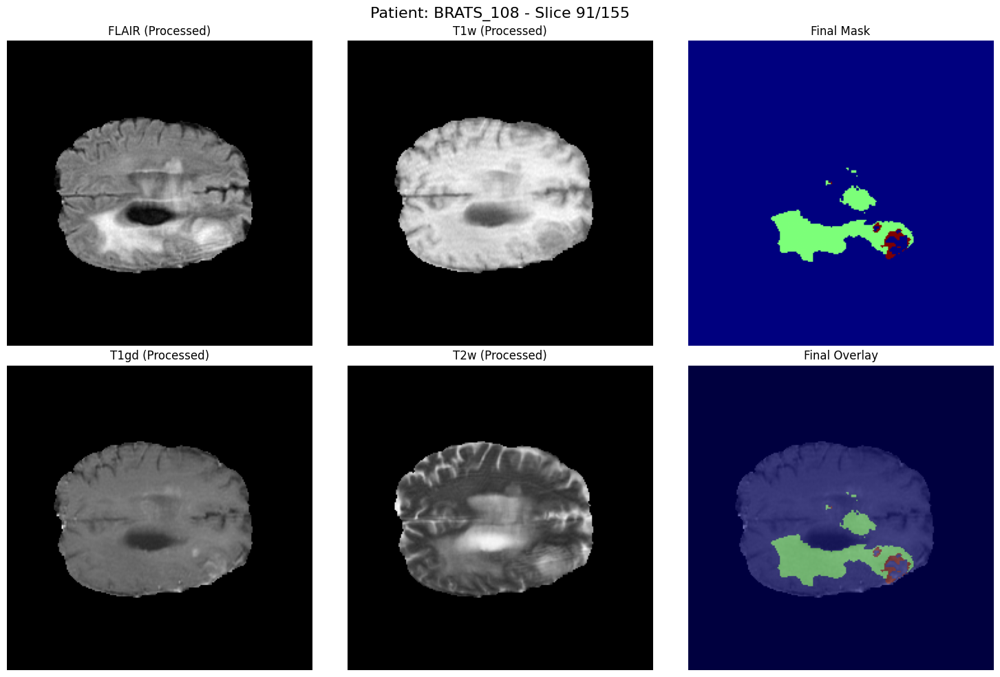


==== ORIGINAL DISCOVERED DATASET ====
Training set - pixel per class:
  Class 0: 33,374,999 pixel (97.9%)
  Class 1: 606,849 pixel (1.8%)
  Class 2: 117,352 pixel (0.3%)
Validation set - pixel per class:
  Class 0: 7,059,112 pixel (98.8%)
  Class 1: 69,111 pixel (1.0%)
  Class 2: 14,177 pixel (0.2%)


In [ ]:
# Check if dataset configuration is available
if 'dataset_config' in locals() and dataset_config:

    # Define correct dataset path
    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    # Initialize the data loader with tracking
    loader_with_tracking = BraTSDataLoaderDiscoveredWithTracking(correct_data_path)

    # Load and process the dataset
    final_images, final_masks, slice_info = loader_with_tracking.process_discovered_dataset_with_tracking()

    if len(final_images) > 0:
      X_train, y_train, X_val, y_val, train_slice_info, val_slice_info = split_and_analyze_dataset(
          final_images,
          final_masks,
          slice_info,
          test_size=0.2,
          seed=13,
          label="Original Discovered Dataset",
          visualize=True)
    else:
        print("No data processed correctly.")

## Training function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 240, 240,  │      2,368 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 240, 240,  │     36,928 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 120, 120,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 120, 120,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 120, 120,  │    147,584 │ activation_20[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 60, 60,    │          0 │ activation_21[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 60, 60,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_23[0][0] 

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 502ms/step - accuracy: 0.7880 - dice_score: 0.3021 - loss: 0.7714 - val_accuracy: 0.8058 - val_dice_score: 0.2467 - val_loss: 0.7859 - learning_rate: 1.0000e-04
Epoch 2/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 64s 436ms/step - accuracy: 0.8986 - dice_score: 0.4406 - loss: 0.6577 - val_accuracy: 0.8990 - val_dice_score: 0.4120 - val_loss: 0.7359 - learning_rate: 1.0000e-04
Epoch 3/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 82s 433ms/step - accuracy: 0.9451 - dice_score: 0.4624 - loss: 0.6107 - val_accuracy: 0.9232 - val_dice_score: 0.5838 - val_loss: 0.7036 - learning_rate: 1.0000e-04
Epoch 4/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 79s 413ms/step - accuracy: 0.9866 - dice_score: 0.5768 - loss: 0.5468 - val_accuracy: 0.9247 - val_dice_score: 0.5576 - val_loss: 0.7262 - learning_rate: 1.0000e-04
Epoch 5/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 84s 427ms/step - accuracy: 0.9866 - dice_score: 0.7289 - loss: 0.5057 - val_accuracy: 0.9772 - val_dice_score: 0.6099 - val_loss: 0.6729 - l

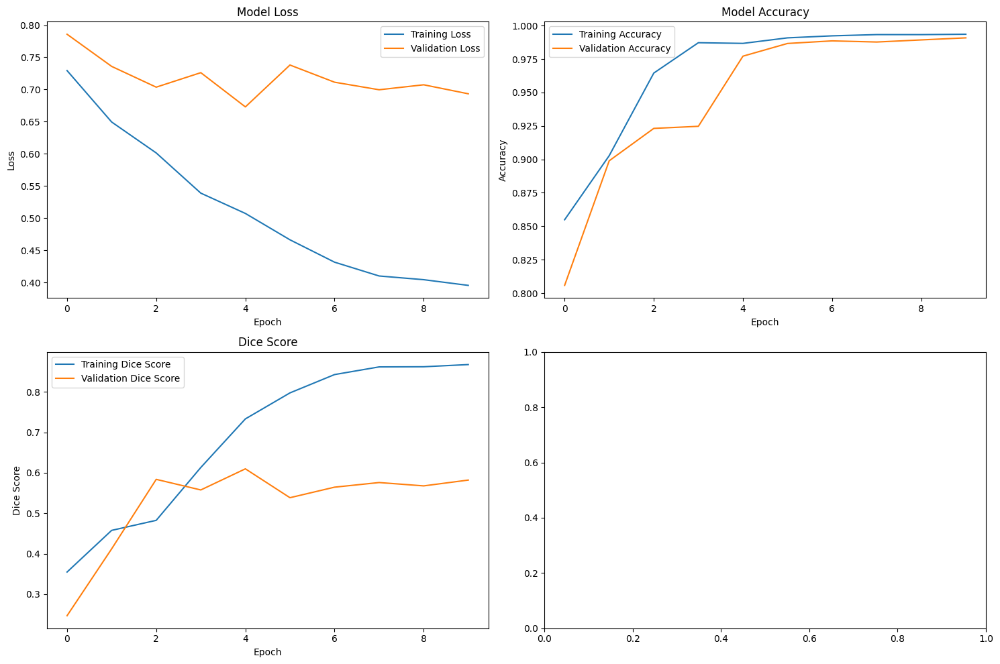

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step


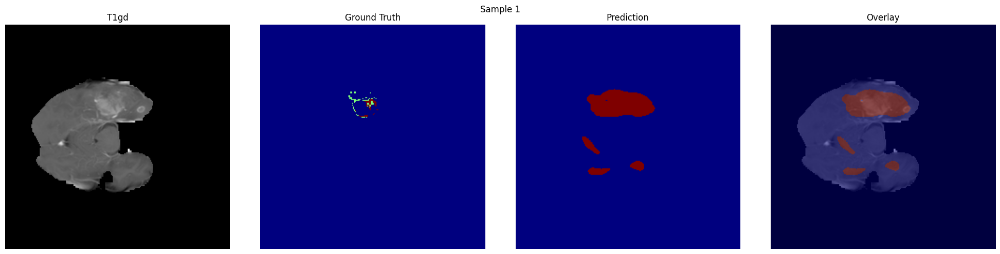

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


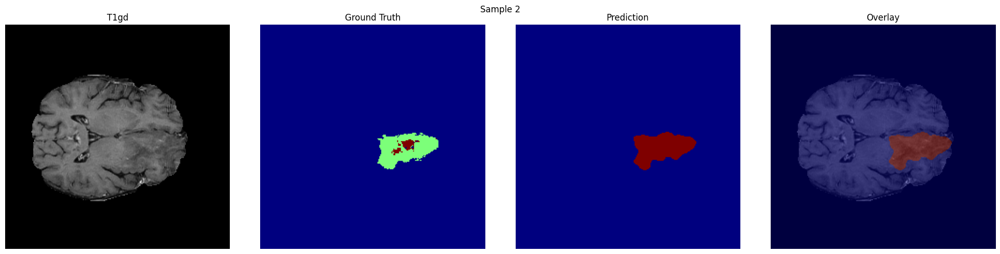

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step


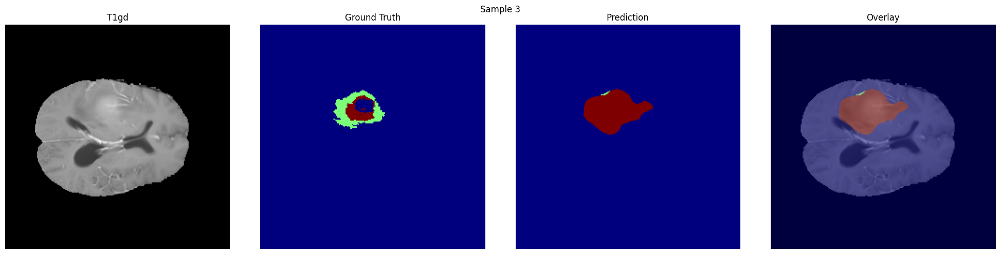

In [ ]:
model_leakage_solved, trainer_leakage_solved = main_training(
    X_train, y_train, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_data_leakage_solved.keras",
    seed=13
)

# NORMALIZATION (for modalities)

## Data Loader Class

In [ ]:
class BraTSDataLoaderDiscoveredWithTracking:

    def __init__(self, data_path, img_size=(240, 240), normalization_method='z_score'):
        # Check the data path
        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path

        self.img_size = img_size
        self.normalization_method = normalization_method

        # Statistics
        self.modality_stats = {
            'FLAIR': {'mean': None, 'std': None, 'min': None, 'max': None},
            'T1w': {'mean': None, 'std': None, 'min': None, 'max': None},
            'T1gd': {'mean': None, 'std': None, 'min': None, 'max': None},
            'T2w': {'mean': None, 'std': None, 'min': None, 'max': None}
        }

    def normalize_modality(self, data, modality_name, method='z_score'):
        # Normalize the data using only the foreground (non-zero) voxels
        foreground_mask = data > 0

        if not np.any(foreground_mask):
            return data

        foreground_data = data[foreground_mask]

        if method == 'z_score':
            # Standardization
            if foreground_data.std() != 0:
                mean_val = foreground_data.mean()
                std_val = foreground_data.std()
                data_normalized = np.zeros_like(data)
                data_normalized[foreground_mask] = (foreground_data - mean_val) / std_val
                return data_normalized
            else:
                return data
        else:
            return self.normalize_modality(data, modality_name, 'z_score')

    def load_nifti_file_with_per_modality_norm(self, filepath):
        # Load a 4D NIfTI file and normalize each modality separately
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()

        modalities = {
            'FLAIR': data[:, :, :, 0],
            'T1w': data[:, :, :, 1],
            'T1gd': data[:, :, :, 2],
            'T2w': data[:, :, :, 3]
        }

        normalized_modalities = {}

        # Normalize each modality independently
        for modality_name, modality_data in modalities.items():
            normalized_data = self.normalize_modality(modality_data, modality_name, self.normalization_method)
            normalized_modalities[modality_name] = normalized_data

        # Stack the normalized modalities back into a single 4D array
        normalized_volume = np.stack([
            normalized_modalities['FLAIR'],
            normalized_modalities['T1w'],
            normalized_modalities['T1gd'],
            normalized_modalities['T2w']
        ], axis=-1)

        return normalized_volume

    def extract_meaningful_slices_with_info(self, image_4d, mask, patient_id):
        # Extract only 2D slices that contain tumor (non-zero mask)
        volume = image_4d

        slices_data = []
        slices_masks = []
        slice_info = []

        for z in range(volume.shape[2]):
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:
                slice_img = volume[:, :, z, :]

                # Resize both the image and the mask to the target size
                slice_img_resized = tf.image.resize(slice_img, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(np.expand_dims(slice_mask, -1), self.img_size, method='nearest').numpy().squeeze()

                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

                # Save metadata about the slice
                slice_info.append({
                    'patient_id': patient_id,
                    'original_slice_idx': z,
                    'total_slices': volume.shape[2],
                    'tumor_pixels': np.sum(slice_mask > 0)
                })

        return np.array(slices_data), np.array(slices_masks), slice_info

    def compute_dataset_statistics(self, patients_to_process = patients_to_process):
        # Collect all foreground pixel values to compute global statistics
        modality_values = {
            'FLAIR': [], 'T1w': [], 'T1gd': [], 'T2w': []
        }

        cases_to_analyze = patients_to_process.copy()

        for i, case in enumerate(cases_to_analyze):
            print(f"Analyzing case {i+1}/{len(cases_to_analyze)}...")

            try:
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                if not os.path.exists(image_path):
                    continue

                nifti_img = nib.load(image_path)
                data = nifti_img.get_fdata()

                # Separate modalities from the 4D image
                modalities = {
                    'FLAIR': data[:, :, :, 0],
                    'T1w': data[:, :, :, 1],
                    'T1gd': data[:, :, :, 2],
                    'T2w': data[:, :, :, 3]
                }

                # Extract foreground pixels from each modality
                for modality_name, modality_data in modalities.items():
                    foreground_mask = modality_data > 0
                    if np.any(foreground_mask):
                        modality_values[modality_name].extend(modality_data[foreground_mask].flatten())

            except Exception as e:
                print(f"Error in case {i+1}: {e}")
                continue

    def process_discovered_dataset_with_tracking(self, patients_to_process = patients_to_process):
        # Full processing: load, normalize, extract slices, and collect info
        all_images = []
        all_masks = []
        all_slice_info = []

        cases_to_process = patients_to_process.copy()

        for i, case in enumerate(cases_to_process):
            patient_id = os.path.basename(case['image']).replace('.nii.gz', '')
            print(f"\nProcessing case {i+1}/{len(cases_to_process)}: {patient_id}")

            try:
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                if not os.path.exists(image_path):
                    continue

                image_4d = self.load_nifti_file_with_per_modality_norm(image_path)

                label_relative_path = case['label'].lstrip('./')
                mask_path = os.path.join(self.data_path, label_relative_path)

                if not os.path.exists(mask_path):
                    continue

                mask = nib.load(mask_path).get_fdata()
                processed_mask = preprocess_mask(mask)

                slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_info(
                    image_4d, processed_mask, patient_id
                )

                print(f"  Extracted {len(slices_data)} useful slices")

                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
                all_slice_info.extend(slice_info)

            except Exception as e:
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)

        print(f"\n Final normalization check:")
        for j, modality in enumerate(['FLAIR', 'T1w', 'T1gd', 'T2w']):
            modality_data = all_images[:, :, :, j]
            fg_mask = modality_data != 0
            if np.any(fg_mask):
                fg_values = modality_data[fg_mask]
                print(f"  {modality}: range=[{fg_values.min():.3f}, {fg_values.max():.3f}], "
                      f"mean={fg_values.mean():.3f}, std={fg_values.std():.3f}")

        return all_images, all_masks, all_slice_info


## Loader in action


Processing case 1/10: BRATS_037
  Extracted 73 useful slices

Processing case 2/10: BRATS_046
  Extracted 77 useful slices

Processing case 3/10: BRATS_056
  Extracted 81 useful slices

Processing case 4/10: BRATS_096
  Extracted 70 useful slices

Processing case 5/10: BRATS_108
  Extracted 81 useful slices

Processing case 6/10: BRATS_130
  Extracted 54 useful slices

Processing case 7/10: BRATS_137
  Extracted 74 useful slices

Processing case 8/10: BRATS_178
  Extracted 74 useful slices

Processing case 9/10: BRATS_207
  Extracted 81 useful slices

Processing case 10/10: BRATS_315
  Extracted 51 useful slices

 Final normalization check:
  FLAIR: range=[-5.157, 12.722], mean=0.078, std=1.034
  T1w: range=[-5.177, 13.829], mean=0.090, std=0.978
  T1gd: range=[-5.672, 17.846], mean=0.065, std=0.977
  T2w: range=[-2.794, 8.001], mean=0.026, std=1.008

---------------------
Visualize a specific brain slice after preprocessing
Patient: BRATS_108
Index in the processed dataset: 358/716


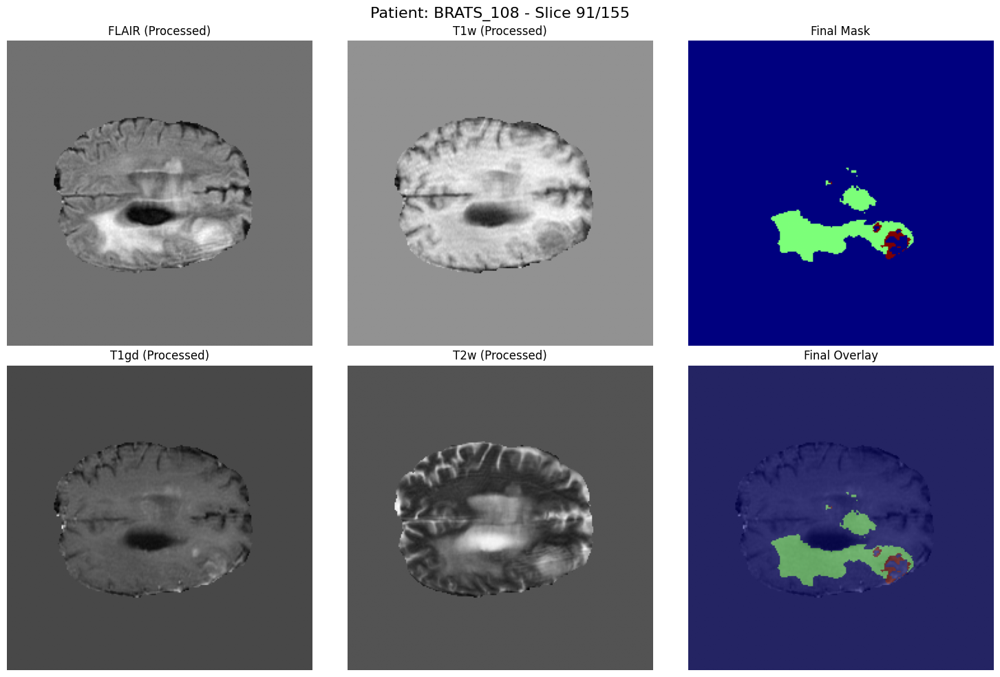


==== DISCOVERED WITH Z-SCORE NORMALIZATION ====
Training set - pixel per class:
  Class 0: 33,374,999 pixel (97.9%)
  Class 1: 606,849 pixel (1.8%)
  Class 2: 117,352 pixel (0.3%)
Validation set - pixel per class:
  Class 0: 7,059,112 pixel (98.8%)
  Class 1: 69,111 pixel (1.0%)
  Class 2: 14,177 pixel (0.2%)


In [ ]:
if 'dataset_config' in locals() and dataset_config:

    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    # Initialize the loader with per-modality normalization
    loader_with_tracking = BraTSDataLoaderDiscoveredWithTracking(
        correct_data_path,
        normalization_method='z_score'
    )

    # Process the dataset using the loader with tracking and normalization
    final_images, final_masks, slice_info = loader_with_tracking.process_discovered_dataset_with_tracking()
    if len(final_images) > 0:
      # Split and analyze
      X_train, y_train, X_val, y_val, train_slice_info, val_slice_info = split_and_analyze_dataset(
          final_images,
          final_masks,
          slice_info,
          test_size=0.2,
          seed=13,
          label="Discovered with z-score normalization",
          visualize=True
      )
    else:
        print("No data processed correctly.")

## Training Function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 240, 240,  │      2,368 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_38[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_36       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 240, 240,  │     36,928 │ activation_36[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_39[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_37       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 120, 120,  │          0 │ activation_37[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 120, 120,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_40[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_38       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 120, 120,  │    147,584 │ activation_38[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_41[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_39       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 60, 60,    │          0 │ activation_39[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 60, 60,    │    295,168 │ max_pooling2d_9[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_42[0][0] 

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 86s 483ms/step - accuracy: 0.7983 - dice_score: 0.3213 - loss: 0.7626 - val_accuracy: 0.9309 - val_dice_score: 0.3025 - val_loss: 0.7694 - learning_rate: 1.0000e-04
Epoch 2/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 79s 463ms/step - accuracy: 0.8534 - dice_score: 0.4250 - loss: 0.6386 - val_accuracy: 0.9077 - val_dice_score: 0.3855 - val_loss: 0.6910 - learning_rate: 1.0000e-04
Epoch 3/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 75s 416ms/step - accuracy: 0.8735 - dice_score: 0.4410 - loss: 0.6017 - val_accuracy: 0.9154 - val_dice_score: 0.3436 - val_loss: 0.6807 - learning_rate: 1.0000e-04
Epoch 4/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 85s 436ms/step - accuracy: 0.9519 - dice_score: 0.4885 - loss: 0.5645 - val_accuracy: 0.9755 - val_dice_score: 0.4757 - val_loss: 0.6590 - learning_rate: 1.0000e-04
Epoch 5/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 89s 487ms/step - accuracy: 0.9889 - dice_score: 0.7055 - loss: 0.4963 - val_accuracy: 0.9761 - val_dice_score: 0.6195 - val_loss: 0.6509 - l

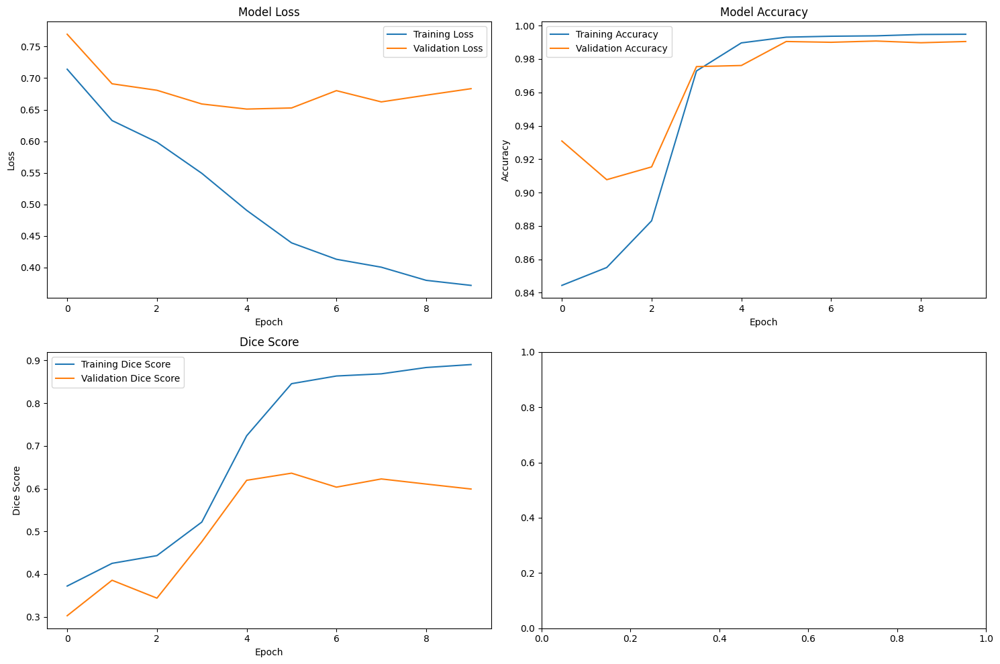

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step


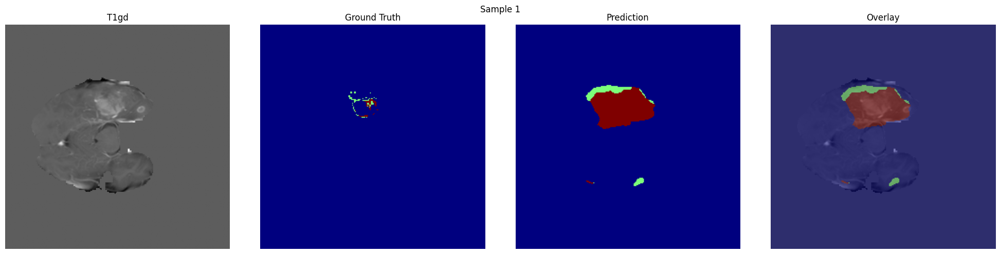

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


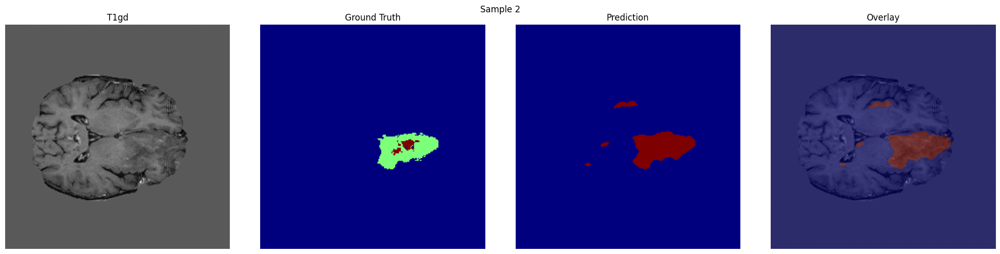

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step


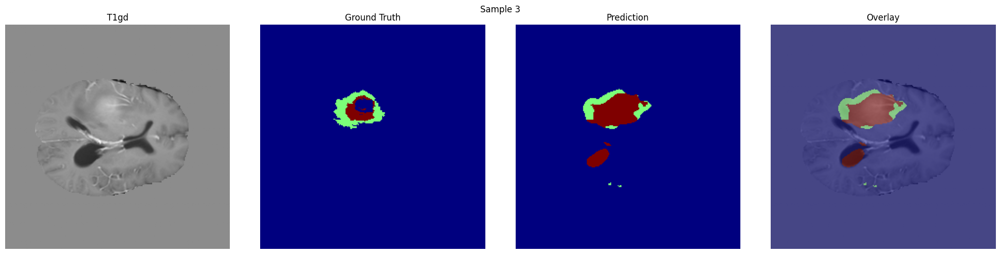

In [ ]:
model_norm, trainer_norm = main_training(
    X_train, y_train, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_normalization_per_modalities.keras",
    seed=13
)

# CROPPING

## Data Loader Class

In [ ]:
class BraTSDataLoaderDiscoveredWithTracking:
    """
   Class developed based on exploratory dataset analysis
   With patient and slice tracking + Intelligent Brain Cropping
    """
    def __init__(self, data_path, img_size=(240, 240), enable_cropping=True, crop_margin=None):
        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path

        self.img_size = img_size
        self.enable_cropping = enable_cropping
        self.crop_margin = crop_margin  # Margin pixels around the brain

        if enable_cropping:
            print(f"Margin cropping: {crop_margin} pixel")

    def find_brain_bbox(self, image_volume, method='otsu'):
        """
        Find the brain's bounding box.
        It returns the bbox: (min_x, max_x, min_y, max_y) of the brain
        """
        # We uses T1w mode (index 1) that usually have good contrast
        t1w_volume = image_volume[:, :, :, 1]

        # Create a brain mask by summing over all slices
        brain_mask = np.zeros(t1w_volume[:, :, 0].shape, dtype=bool)

        for z in range(t1w_volume.shape[2]):
            slice_img = t1w_volume[:, :, z]

            if method == 'otsu':
                # Otsu method to find threshold automatically
                try:
                    from skimage.filters import threshold_otsu
                    if slice_img.std() > 1e-6:
                        thresh = threshold_otsu(slice_img)
                        slice_mask = (slice_img > thresh).astype(bool)
                    else:
                        slice_mask = np.zeros_like(slice_img, dtype=bool)
                except ImportError:
                    # Fallback if scikit-image isn't available
                    thresh = slice_img.mean() + slice_img.std()
                    slice_mask = (slice_img > thresh).astype(bool)
                except:
                    # Fallback if Otsu fails
                    thresh = slice_img.mean() + slice_img.std()
                    slice_mask = (slice_img > thresh).astype(bool)

            elif method == 'threshold':
                # Based on adaptive threshold
                thresh = slice_img.mean() + 0.5 * slice_img.std()
                slice_mask = (slice_img > thresh).astype(bool)

            elif method == 'combined':
                # Combination of different approaches
                thresh1 = slice_img.mean() + 0.3 * slice_img.std()
                mask1 = (slice_img > thresh1).astype(bool)

                try:
                    from skimage.filters import threshold_otsu
                    if slice_img.std() > 1e-6:
                        thresh2 = threshold_otsu(slice_img)
                        mask2 = (slice_img > thresh2).astype(bool)
                    else:
                        mask2 = mask1.copy()
                except:
                    mask2 = mask1.copy()

                slice_mask = np.logical_or(mask1, mask2)

            brain_mask = np.logical_or(brain_mask, slice_mask)

        # Find bounding box's coordinates
        coords = np.where(brain_mask)
        if len(coords[0]) > 0:
            min_x, max_x = coords[1].min(), coords[1].max()
            min_y, max_y = coords[0].min(), coords[0].max()
        else:
            # Fallback: uses the complete image
            min_x, max_x = 0, brain_mask.shape[1] - 1
            min_y, max_y = 0, brain_mask.shape[0] - 1

        return min_x, max_x, min_y, max_y

    def apply_brain_crop(self, image_slice, mask_slice, bbox):
        """
        Apply cropping to a single slice.
        Returns cropped image and mask
        """
        min_x, max_x, min_y, max_y = bbox

        # Add margin but stay within the image boundaries
        height, width = image_slice.shape[:2]

        min_x = max(0, min_x - self.crop_margin)
        max_x = min(width - 1, max_x + self.crop_margin)
        min_y = max(0, min_y - self.crop_margin)
        max_y = min(height - 1, max_y + self.crop_margin)

        # Crop the image and the mask
        cropped_image = image_slice[min_y:max_y+1, min_x:max_x+1, :]
        cropped_mask = mask_slice[min_y:max_y+1, min_x:max_x+1]

        return cropped_image, cropped_mask, (min_x, max_x, min_y, max_y)

    def load_nifti_file(self, filepath):
        """Upload and normalize NIfTI file basing on statistical analysis"""
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()

        # Normalization discovered by analysis
        if data.std() != 0:
            data = (data - data.mean()) / data.std()

        return data

    def extract_meaningful_slices_with_info(self, image_4d, mask, patient_id):
        """Extracts only slices with content"""
        modalities = {
            'FLAIR': image_4d[:, :, :, 0],
            'T1w': image_4d[:, :, :, 1],
            'T1gd': image_4d[:, :, :, 2],
            'T2w': image_4d[:, :, :, 3]
        }

        # Stack of the modes
        volume = np.stack([
            modalities['FLAIR'],
            modalities['T1w'],
            modalities['T1gd'],
            modalities['T2w']
        ], axis=-1)

        # Find the brain's bounding box if cropping is enabled
        if self.enable_cropping:
            brain_bbox = self.find_brain_bbox(volume)
            crop_info = f"Bbox: x[{brain_bbox[0]}:{brain_bbox[1]}], y[{brain_bbox[2]}:{brain_bbox[3]}]"

        slices_data = []
        slices_masks = []
        slice_info = []  # List to trace origin

        # Extract only slices with annotations
        for z in range(volume.shape[2]):
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:  # Only slice with content
                slice_img = volume[:, :, z, :]

                # Apply brain cropping if enabled
                if self.enable_cropping and brain_bbox is not None:
                    slice_img_cropped, slice_mask_cropped, actual_bbox = self.apply_brain_crop(
                        slice_img, slice_mask, brain_bbox
                    )
                    crop_info_slice = {
                        'original_size': slice_img.shape[:2],
                        'cropped_size': slice_img_cropped.shape[:2],
                        'bbox_used': actual_bbox,
                        'reduction_factor': (slice_img_cropped.shape[0] * slice_img_cropped.shape[1]) / (slice_img.shape[0] * slice_img.shape[1])
                    }
                else:
                    slice_img_cropped = slice_img
                    slice_mask_cropped = slice_mask
                    crop_info_slice = {
                        'original_size': slice_img.shape[:2],
                        'cropped_size': slice_img.shape[:2],
                        'bbox_used': None,
                        'reduction_factor': 1.0
                    }

                # Resize of target's dimensions
                slice_img_resized = tf.image.resize(slice_img_cropped, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(
                    np.expand_dims(slice_mask_cropped, -1),
                    self.img_size,
                    method='nearest'
                ).numpy().squeeze()

                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

                # Save info of the slice
                slice_info.append({
                    'patient_id': patient_id,
                    'original_slice_idx': z,
                    'total_slices': volume.shape[2],
                    'tumor_pixels': np.sum(slice_mask > 0),
                    'crop_info': crop_info_slice
                })

        if self.enable_cropping:
            avg_reduction = np.mean([info['crop_info']['reduction_factor'] for info in slice_info])
            print(f"  Reducing the average background: {(1-avg_reduction)*100:.1f}%")

        return np.array(slices_data), np.array(slices_masks), slice_info

    def process_discovered_dataset_with_tracking(self, patients_to_process = None, max_cases = None):
        """Process the dataset while keeping track of the origin of each slice"""
        all_images = []
        all_masks = []
        all_slice_info = []

        cases_to_process = patients_to_process.copy()
        #cases_to_process = cases_to_process["training"]

        for i, case in enumerate(cases_to_process):
            patient_id = os.path.basename(case['image']).replace('.nii.gz', '')
            print(f"\nTrying case {i+1}/{len(cases_to_process)}: {patient_id}")

            try:
                # Build the correct path by removing the leading "./"
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                # Upload image
                image_4d = self.load_nifti_file(image_path)

                # Build the correct path for the mask
                label_relative_path = case['label'].lstrip('./')
                mask_path = os.path.join(self.data_path, label_relative_path)

                # Verify that the file exists
                if not os.path.exists(mask_path):
                    continue

                # Upload the mask
                mask = nib.load(mask_path).get_fdata()

                # Preprocess using the discoveries
                processed_mask = preprocess_mask(mask)
                slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_info(
                    image_4d, processed_mask, patient_id
                )

                print(f"  Extracted {len(slices_data)} useful slices")

                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
                all_slice_info.extend(slice_info)

            except Exception as e:
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)

        print(f"Image shapes: {all_images.shape}")
        print(f"Mask shapes: {all_masks.shape}")

        # Cropping statistics
        if self.enable_cropping:
            crop_reductions = [info['crop_info']['reduction_factor'] for info in all_slice_info]
            avg_reduction = np.mean(crop_reductions)
            print(f"\n BRAIN CROPPING STATISTICS:")
            print(f"  Reducing the media background: {(1-avg_reduction)*100:.1f}%")

        # Distribution of each patient
        patients = [info['patient_id'] for info in all_slice_info]
        from collections import Counter
        patient_counts = Counter(patients)

        return all_images, all_masks, all_slice_info


def compare_cropping_effects(data_path, patients_to_process = None, patient_case=0):
    """Compare the effect of cropping on a specific slide"""
    print(f"\n=== COMPARISON BRAIN CROPPING EFFECTS ===")

    # Loader without cropping
    loader_no_crop = BraTSDataLoaderDiscoveredWithTracking(
        data_path, enable_cropping=False
    )

    # Loader with cropping
    loader_with_crop = BraTSDataLoaderDiscoveredWithTracking(
        data_path, enable_cropping=True, crop_margin=10
    )

    # Process a single case
    test_case = patients_to_process[patient_case:patient_case+1]

    # Without cropping
    images_no_crop, masks_no_crop, info_no_crop = loader_no_crop.process_discovered_dataset_with_tracking(patients_to_process = test_case)

    # With cropping
    images_with_crop, masks_with_crop, info_with_crop = loader_with_crop.process_discovered_dataset_with_tracking(patients_to_process = test_case)

    if len(images_no_crop) > 0 and len(images_with_crop) > 0:
        mid_idx = len(images_no_crop) // 2

        fig, axes = plt.subplots(2, 4, figsize=(20, 10))
        fig.suptitle('Comparison: Without Brain Cropping vs With Brain Cropping', fontsize=16)

        modality_names = ['FLAIR', 'T1w', 'T1gd', 'T2w']

        # First row: without cropping
        for i in range(4):
            axes[0, i].imshow(images_no_crop[mid_idx, :, :, i], cmap='gray')
            axes[0, i].set_title(f'{modality_names[i]} - Original')
            axes[0, i].axis('off')

        # Second row: with cropping
        for i in range(4):
            axes[1, i].imshow(images_with_crop[mid_idx, :, :, i], cmap='gray')
            axes[1, i].set_title(f'{modality_names[i]} - Brain Cropped')
            axes[1, i].axis('off')

        plt.tight_layout()
        plt.show()

        # Statistics
        crop_info = info_with_crop[mid_idx]['crop_info']
        print(f"\nComparison of statistics:")
        print(f"Background reduction: {(1-crop_info['reduction_factor'])*100:.1f}%")
        print(f"Original dimension: {crop_info['original_size']}")
        print(f"Cropped dimension: {crop_info['cropped_size']}")

## Loader in Action

Margin cropping: 2 pixel

Trying case 1/10: BRATS_037
  Reducing the average background: 57.0%
  Extracted 73 useful slices

Trying case 2/10: BRATS_046
  Reducing the average background: 56.6%
  Extracted 77 useful slices

Trying case 3/10: BRATS_056
  Reducing the average background: 63.1%
  Extracted 81 useful slices

Trying case 4/10: BRATS_096
  Reducing the average background: 60.1%
  Extracted 70 useful slices

Trying case 5/10: BRATS_108
  Reducing the average background: 57.1%
  Extracted 81 useful slices

Trying case 6/10: BRATS_130
  Reducing the average background: 57.8%
  Extracted 54 useful slices

Trying case 7/10: BRATS_137
  Reducing the average background: 57.8%
  Extracted 74 useful slices

Trying case 8/10: BRATS_178
  Reducing the average background: 59.0%
  Extracted 74 useful slices

Trying case 9/10: BRATS_207
  Reducing the average background: 57.1%
  Extracted 81 useful slices

Trying case 10/10: BRATS_315
  Reducing the average background: 61.9%
  Extracted 5

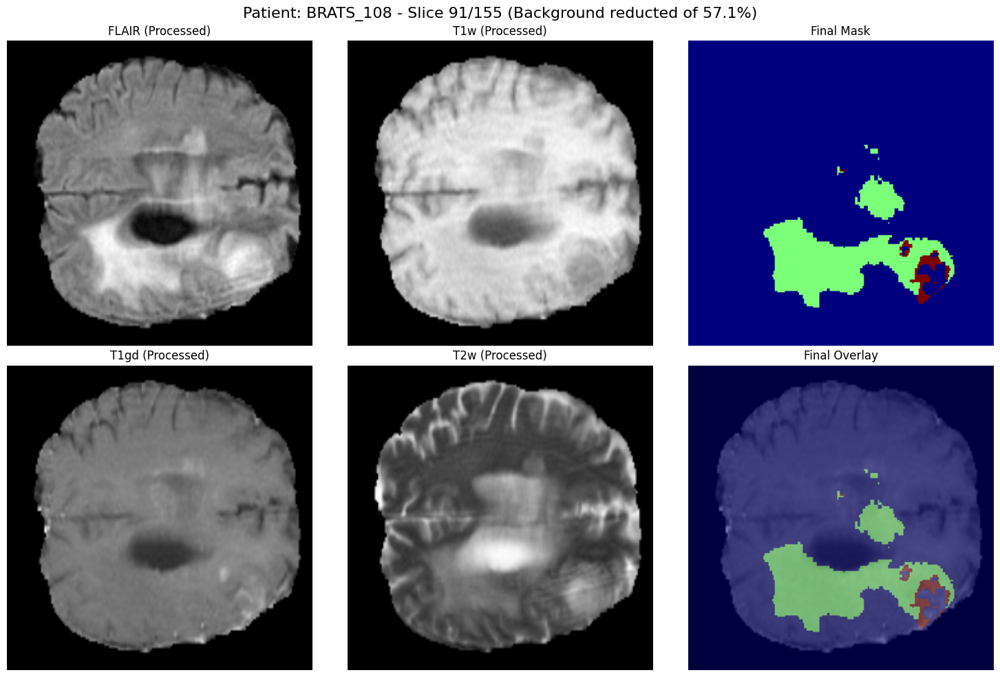


==== BRAIN CROPPING ====
Training set - pixel per class:
  Class 0: 32,344,820 pixel (94.9%)
  Class 1: 1,476,650 pixel (4.3%)
  Class 2: 277,730 pixel (0.8%)
Validation set - pixel per class:
  Class 0: 6,941,721 pixel (97.2%)
  Class 1: 166,043 pixel (2.3%)
  Class 2: 34,636 pixel (0.5%)
Training set - background average reduction: 58.6%
Validation set - background average reduction: 59.1%


In [ ]:
if 'dataset_config' in locals() and dataset_config:

    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    # Loader creation with brain cropping enabled
    loader_with_cropping = BraTSDataLoaderDiscoveredWithTracking(
        correct_data_path,
        enable_cropping=True,  # Enable brain cropping
        crop_margin=2  # Cropping margin
    )

    final_images, final_masks, slice_info = loader_with_cropping.process_discovered_dataset_with_tracking(patients_to_process=patients_to_process)
    if len(final_images) > 0:
        X_train, y_train, X_val, y_val, train_slice_info, val_slice_info = split_and_analyze_dataset(
            final_images,
            final_masks,
            slice_info,
            test_size=0.2,
            seed=13,
            label="Brain cropping",
            visualize=True
        )
    else:
        print("No data processed.")


=== COMPARISON BRAIN CROPPING EFFECTS ===
Margin cropping: 10 pixel

Trying case 1/1: BRATS_037
  Extracted 73 useful slices
Image shapes: (73, 240, 240, 4)
Mask shapes: (73, 240, 240)

Trying case 1/1: BRATS_037
  Reducing the average background: 47.8%
  Extracted 73 useful slices
Image shapes: (73, 240, 240, 4)
Mask shapes: (73, 240, 240)

 BRAIN CROPPING STATISTICS:
  Reducing the media background: 47.8%


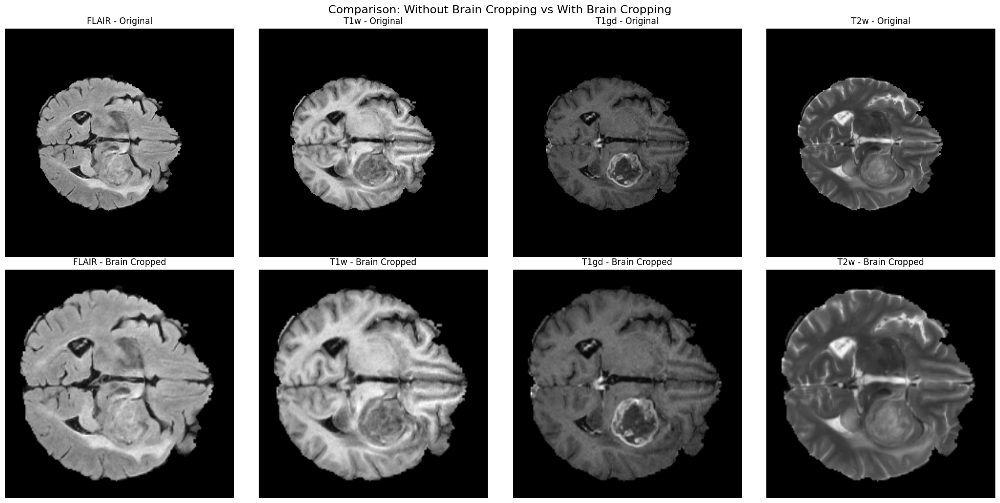


Comparison of statistics:
Background reduction: 47.8%
Original dimension: (240, 240)
Cropped dimension: (167, 180)


In [ ]:
compare_cropping_effects(correct_data_path, patients_to_process=patients_to_process, patient_case=0)

## Training Function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 240, 240,  │      2,368 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 240, 240,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 240, 240,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 120, 120,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 120, 120,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 120, 120,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 60, 60,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 60, 60,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_4[0][0]  

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 99s 526ms/step - accuracy: 0.7605 - dice_score: 0.3431 - loss: 0.7233 - val_accuracy: 0.8329 - val_dice_score: 0.2979 - val_loss: 0.7696 - learning_rate: 1.0000e-04
Epoch 2/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 69s 456ms/step - accuracy: 0.9347 - dice_score: 0.5131 - loss: 0.5752 - val_accuracy: 0.8867 - val_dice_score: 0.3492 - val_loss: 0.7035 - learning_rate: 1.0000e-04
Epoch 3/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 60s 408ms/step - accuracy: 0.9409 - dice_score: 0.5471 - loss: 0.5229 - val_accuracy: 0.8513 - val_dice_score: 0.3395 - val_loss: 0.7016 - learning_rate: 1.0000e-04
Epoch 4/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 92s 476ms/step - accuracy: 0.9441 - dice_score: 0.5767 - loss: 0.4772 - val_accuracy: 0.8945 - val_dice_score: 0.3499 - val_loss: 0.6853 - learning_rate: 1.0000e-04
Epoch 5/10
148/148 ━━━━━━━━━━━━━━━━━━━━ 76s 440ms/step - accuracy: 0.9509 - dice_score: 0.5936 - loss: 0.4447 - val_accuracy: 0.9199 - val_dice_score: 0.3512 - val_loss: 0.6787 - l

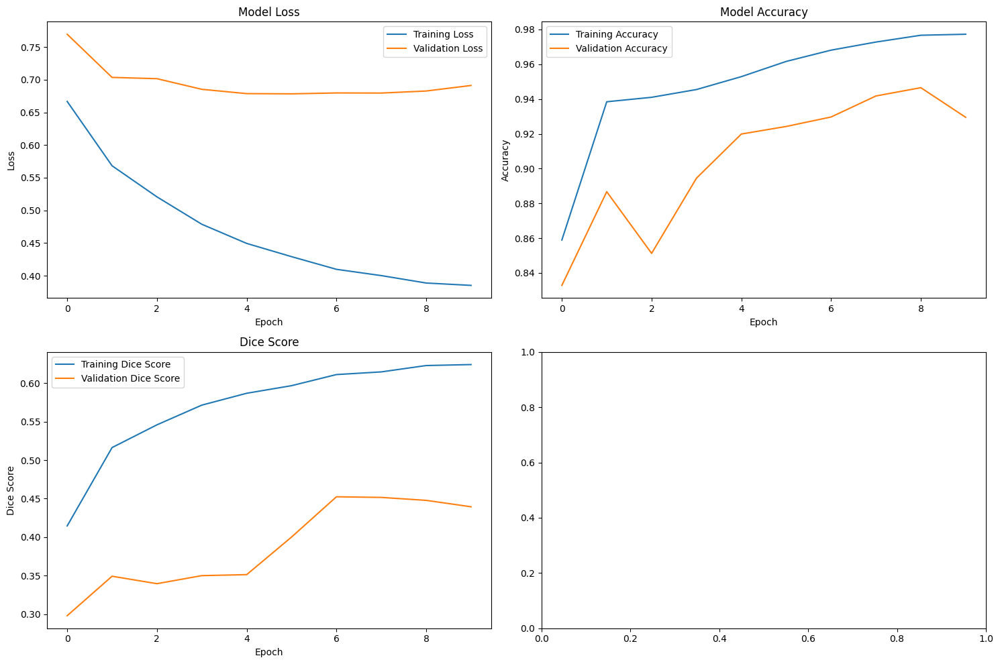

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step


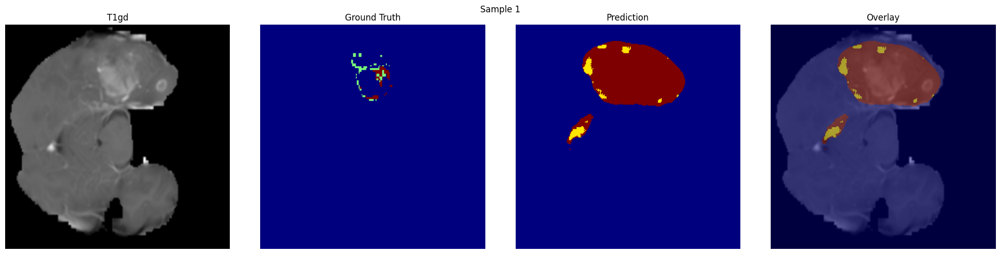

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


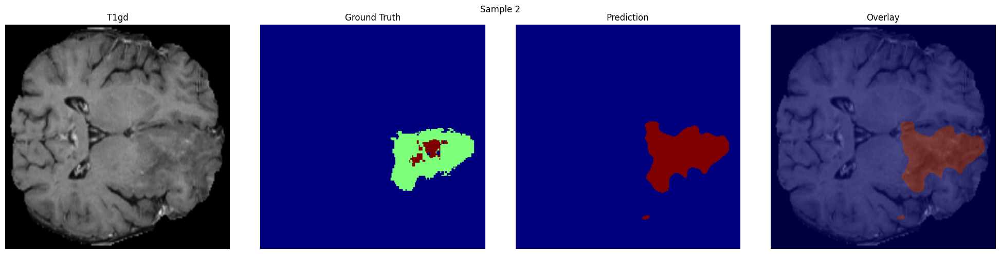

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step


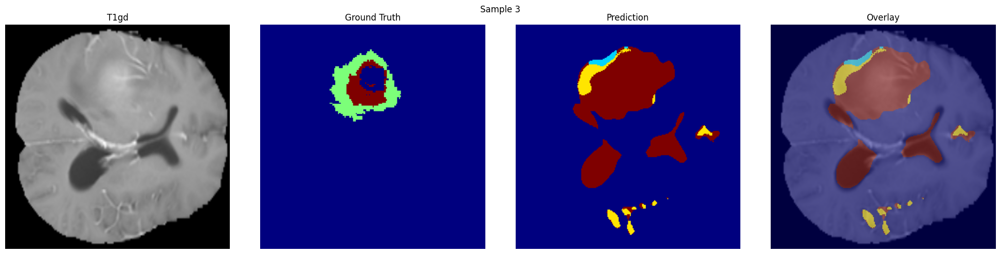

In [ ]:
model_crop, trainer_crop = main_training(
    X_train, y_train, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_cropping.keras",
    seed=13
)

# AUGMENATION RELATIVE TO MINORITY CLASSES (Rotations)

## Data Loader Class

In [ ]:
class BraTSDataLoaderDiscoveredWithTracking:
    """
    Class developed based on exploratory analysis of the BraTS dataset.
    Tracks patient ID and slice index for each image.
    """

    def __init__(self, data_path, img_size=(240, 240)):
        # Fix the path if needed
        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path

        self.img_size = img_size


    def load_nifti_file(self, filepath):
        """Load and normalize NIfTI files based on dataset analysis."""
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()

        # Normalize data if standard deviation is non-zero
        if data.std() != 0:
            data = (data - data.mean()) / data.std()

        return data

    def extract_meaningful_slices_with_info(self, image_4d, mask, patient_id):
        """Extract only the slices that contain tumor annotations."""
        modalities = {
            'FLAIR': image_4d[:, :, :, 0],
            'T1w': image_4d[:, :, :, 1],
            'T1gd': image_4d[:, :, :, 2],
            'T2w': image_4d[:, :, :, 3]
        }

        # Combine modalities into a single volume (H, W, Z, Channels)
        volume = np.stack([
            modalities['FLAIR'],
            modalities['T1w'],
            modalities['T1gd'],
            modalities['T2w']
        ], axis=-1)

        slices_data = []
        slices_masks = []
        slice_info = []

        for z in range(volume.shape[2]):  # Loop through slices along Z-axis
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:  # Process only non-empty masks
                slice_img = volume[:, :, z, :]

                # Resize the image and mask to the target size
                slice_img_resized = tf.image.resize(slice_img, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(
                    np.expand_dims(slice_mask, -1),
                    self.img_size,
                    method='nearest'  # Preserve label values
                ).numpy().squeeze()

                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

                # Store metadata about the slice
                slice_info.append({
                    'patient_id': patient_id,
                    'original_slice_idx': z,
                    'total_slices': volume.shape[2],
                    'tumor_pixels': np.sum(slice_mask > 0)
                })

        return np.array(slices_data), np.array(slices_masks), slice_info

    def process_discovered_dataset_with_tracking(self, patients_to_process = patients_to_process):
        """
        Process the dataset using the discovered insights.
        Keep track of which patient and slice each image comes from.
        """

        all_images = []
        all_masks = []
        all_slice_info = []

        cases_to_process = patients_to_process.copy()

        for i, case in enumerate(cases_to_process):
            patient_id = os.path.basename(case['image']).replace('.nii.gz', '')
            print(f"\nProcessing case {i+1}/{len(cases_to_process)}: {patient_id}")

            try:
                # Clean the image path
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                if not os.path.exists(image_path):
                    print(f"  Image file not found: {image_path}")
                    continue

                # Load the 4D image volume
                image_4d = self.load_nifti_file(image_path)

                # Clean the mask path
                label_relative_path = case['label'].lstrip('./')
                mask_path = os.path.join(self.data_path, label_relative_path)

                if not os.path.exists(mask_path):
                    print(f"  Mask file not found: {mask_path}")
                    continue

                # Load and preprocess the mask
                mask = nib.load(mask_path).get_fdata()
                processed_mask = preprocess_mask(mask)

                # Extract meaningful slices and metadata
                slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_info(
                    image_4d, processed_mask, patient_id
                )

                print(f"Extracted {len(slices_data)} useful slices")

                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
                all_slice_info.extend(slice_info)

            except Exception as e:
                print(f" Error: {e}")
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)

        # Show distribution of slices per patient
        from collections import Counter
        patients = [info['patient_id'] for info in all_slice_info]
        patient_counts = Counter(patients)

        return all_images, all_masks, all_slice_info

## Loader in Action



Processing case 1/10: BRATS_037
Extracted 73 useful slices

Processing case 2/10: BRATS_046
Extracted 77 useful slices

Processing case 3/10: BRATS_056
Extracted 81 useful slices

Processing case 4/10: BRATS_096
Extracted 70 useful slices

Processing case 5/10: BRATS_108
Extracted 81 useful slices

Processing case 6/10: BRATS_130
Extracted 54 useful slices

Processing case 7/10: BRATS_137
Extracted 74 useful slices

Processing case 8/10: BRATS_178
Extracted 74 useful slices

Processing case 9/10: BRATS_207
Extracted 81 useful slices

Processing case 10/10: BRATS_315
Extracted 51 useful slices

---------------------
Visualize a specific brain slice after preprocessing
Patient: BRATS_108
Index in the processed dataset: 358/716


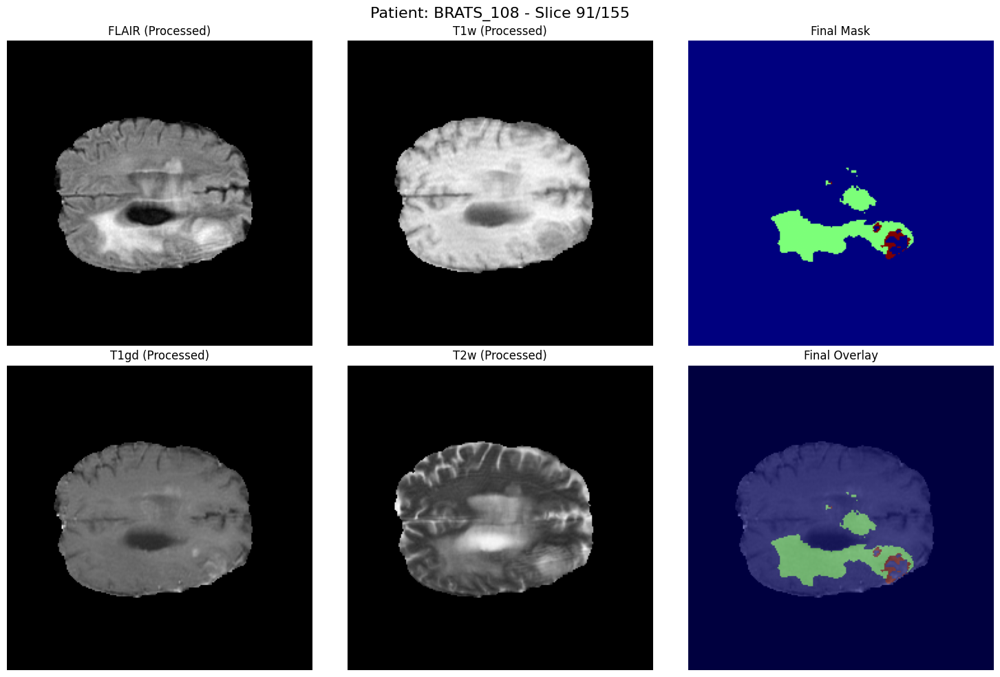


==== BASIC ====
Training set - pixel per class:
  Class 0: 33,374,999 pixel (97.9%)
  Class 1: 606,849 pixel (1.8%)
  Class 2: 117,352 pixel (0.3%)
Validation set - pixel per class:
  Class 0: 7,059,112 pixel (98.8%)
  Class 1: 69,111 pixel (1.0%)
  Class 2: 14,177 pixel (0.2%)


In [ ]:
if 'dataset_config' in locals() and dataset_config:

    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    loader_with_tracking = BraTSDataLoaderDiscoveredWithTracking(correct_data_path)

    final_images, final_masks, slice_info = loader_with_tracking.process_discovered_dataset_with_tracking()

    if len(final_images) > 0:
        X_train, y_train, X_val, y_val, train_slice_info, val_slice_info = split_and_analyze_dataset(
            final_images,
            final_masks,
            slice_info,
            test_size=0.2,
            seed=13,
            label="Basic",
            visualize=True
        )
    else:
        print("No data processed correctly.")


## AUGMENTATION




In [ ]:
def analyze_class_distribution(y_train, title="Dataset"):
    """Print the distribution of pixel classes in the dataset."""
    print(f"\nClass distribution - {title}")

    # Flatten the mask array and convert to integers
    train_flat = y_train.flatten().astype(int)

    # Get unique class labels and their counts
    unique_classes, counts = np.unique(train_flat, return_counts=True)

    total_pixels = len(train_flat)
    # Print percentage of each class
    for class_id, count in zip(unique_classes, counts):
        percentage = (count / total_pixels) * 100
        print(f"Class {class_id}: {count:,} pixels ({percentage:.2f}%)")

    return unique_classes, counts

def identify_minority_slices(y_train, train_slice_info, minority_threshold=0.05):
    """
    Identify slices that contain significant proportions of minority classes.
    Returns a list of slice indices suitable for augmentation and a list
    with detailed information for each slice
    """
    all_pixels = y_train.flatten().astype(int)

    # Global class distribution
    global_unique, global_counts = np.unique(all_pixels, return_counts=True)
    total_global_pixels = len(all_pixels)

    # Identify minority classes based on global frequency
    minority_classes = []
    for class_id, count in zip(global_unique, global_counts):
        global_percentage = count / total_global_pixels
        if class_id != 0 and global_percentage < 0.3:
            minority_classes.append(class_id)

    augmentation_candidates = []
    slice_details = []

    # Analysis of each slice individually
    for i in range(len(y_train)):
        mask = y_train[i]
        unique_classes, counts = np.unique(mask.flatten(), return_counts=True)
        total_pixels = mask.size

        # Calculate class proportions within this slice
        class_percentages = {
            class_id: count / total_pixels for class_id, count in zip(unique_classes, counts)
        }

        minority_content = 0
        minority_classes_in_slice = []

        # Check which minority classes are present in significant proportion
        for minority_class in minority_classes:
            if minority_class in class_percentages:
                if class_percentages[minority_class] >= minority_threshold:
                    minority_content += class_percentages[minority_class]
                    minority_classes_in_slice.append(minority_class)

        # Store detailed info for this slice
        slice_info = {
            'slice_idx': i,
            'patient_id': train_slice_info[i]['patient_id'],
            'minority_content': minority_content,
            'minority_classes': minority_classes_in_slice,
            'class_percentages': class_percentages
        }
        slice_details.append(slice_info)

        # Mark for augmentation if significant minority content exists
        if minority_content > 0:
            augmentation_candidates.append(i)

    print(f"\nTotal slices: {len(y_train)}")
    print(f"Slices with minority classes: {len(augmentation_candidates)}")

    return augmentation_candidates, slice_details

def apply_augmentation_transforms(image, mask):
    """
    Apply a set of predefined augmentations to a (image, mask) pair.
    Returns a list of tuples: (augmented_image, augmented_mask, transform_name)
    """
    augmented_pairs = []

    # 90° clockwise rotation
    img_rot90 = np.rot90(image, k=-1, axes=(0, 1))
    mask_rot90 = np.rot90(mask, k=-1, axes=(0, 1))
    augmented_pairs.append((img_rot90, mask_rot90, "rot90_cw"))

    # 180° rotation
    img_rot180 = np.rot90(image, k=2, axes=(0, 1))
    mask_rot180 = np.rot90(mask, k=2, axes=(0, 1))
    augmented_pairs.append((img_rot180, mask_rot180, "rot180"))

    # 270° rotation (90° counter-clockwise)
    img_rot270 = np.rot90(image, k=1, axes=(0, 1))
    mask_rot270 = np.rot90(mask, k=1, axes=(0, 1))
    augmented_pairs.append((img_rot270, mask_rot270, "rot270_ccw"))

    # Vertical flip
    img_flip_v = np.flipud(image)
    mask_flip_v = np.flipud(mask)
    augmented_pairs.append((img_flip_v, mask_flip_v, "flip_vertical"))

    # Horizontal flip
    img_flip_h = np.fliplr(image)
    mask_flip_h = np.fliplr(mask)
    augmented_pairs.append((img_flip_h, mask_flip_h, "flip_horizontal"))

    # Combined: 90° rotation + vertical flip
    img_combo = np.flipud(img_rot90)
    mask_combo = np.flipud(mask_rot90)
    augmented_pairs.append((img_combo, mask_combo, "rot90_flip_v"))

    return augmented_pairs

def selective_augmentation(X_train, y_train, train_slice_info,
                          minority_threshold=0.05,
                          max_augmentations_per_slice=3,
                          prioritize_high_content=True):
    """
    Apply augmentation selectively to slices rich in minority classes.
    """
    # Find candidate slices with minority class content
    candidates, slice_details = identify_minority_slices(y_train, train_slice_info, minority_threshold)

    if not candidates:
        return X_train, y_train, train_slice_info

    # Optionally prioritize slices with the highest minority class content
    if prioritize_high_content:
        candidate_details = [d for d in slice_details if d['slice_idx'] in candidates]
        candidate_details.sort(key=lambda x: x['minority_content'], reverse=True)
        candidates = [d['slice_idx'] for d in candidate_details]

    augmented_images = []
    augmented_masks = []
    augmented_info = []

    for slice_idx in candidates:
        image = X_train[slice_idx]
        mask = y_train[slice_idx]

        # Apply all augmentations and select a limited number
        augmented_pairs = apply_augmentation_transforms(image, mask)
        selected_pairs = augmented_pairs[:max_augmentations_per_slice]

        # Store augmented data and associated metadata
        for aug_img, aug_mask, transform_name in selected_pairs:
            augmented_images.append(aug_img)
            augmented_masks.append(aug_mask)

            aug_info = train_slice_info[slice_idx].copy()
            aug_info.update({
                'original_idx': slice_idx,
                'augmentation': transform_name,
                'is_augmented': True
            })
            augmented_info.append(aug_info)

    # Combine original and augmented data
    X_augmented = np.concatenate([X_train, np.array(augmented_images)], axis=0)
    y_augmented = np.concatenate([y_train, np.array(augmented_masks)], axis=0)

    # Mark original slices as not augmented
    original_info = [{**info, 'is_augmented': False} for info in train_slice_info]

    combined_info = original_info + augmented_info

    print(f"\nOriginal dataset: {X_train.shape[0]} slices")
    print(f"Augmented slices: {len(augmented_images)}")
    print(f"Final dataset: {X_augmented.shape[0]} slices")

    return X_augmented, y_augmented, combined_info


def balance_with_selective_augmentation(X_train, y_train, train_slice_info,
                                       minority_threshold=0.05,
                                       max_augmentations=6,
                                       show_stats=True,
                                       visualize_example=False):
    """
    Balance dataset by augmenting slices with underrepresented classes.
    """
    print("Dataset balancing with selective augmentation")

    if show_stats:
        analyze_class_distribution(y_train, "ORIGINAL")

    X_balanced, y_balanced, balanced_info = selective_augmentation(
        X_train, y_train, train_slice_info,
        minority_threshold=minority_threshold,
        max_augmentations_per_slice=max_augmentations,
        prioritize_high_content=True
    )

    if show_stats:
        analyze_class_distribution(y_balanced, "AUGMENTED")

    return X_balanced, y_balanced, balanced_info

In [ ]:
X_balanced, y_balanced, balanced_info = balance_with_selective_augmentation(
    X_train, y_train, train_slice_info,
    minority_threshold=0.05,  # 5% threshold for minority classes
    max_augmentations=6,      # max augmentations per slice
    show_stats=True,          # Show stats
    visualize_example=False    # Show a visual exemple
)

Dataset balancing with selective augmentation

Class distribution - ORIGINAL
Class 0: 33,374,999 pixels (97.88%)
Class 1: 606,849 pixels (1.78%)
Class 2: 117,352 pixels (0.34%)

Total slices: 592
Slices with minority classes: 24

Original dataset: 592 slices
Augmented slices: 144
Final dataset: 736 slices

Class distribution - AUGMENTED
Class 0: 41,120,687 pixels (97.00%)
Class 1: 1,061,745 pixels (2.50%)
Class 2: 211,168 pixels (0.50%)


## Training Function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 240, 240,  │      2,368 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 240, 240,  │     36,928 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 120, 120,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 120, 120,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 120, 120,  │    147,584 │ activation_20[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 60, 60,    │          0 │ activation_21[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 60, 60,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_23[0][0] 

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
184/184 ━━━━━━━━━━━━━━━━━━━━ 92s 423ms/step - accuracy: 0.7673 - dice_score: 0.3250 - loss: 0.7453 - val_accuracy: 0.8543 - val_dice_score: 0.2917 - val_loss: 0.7634 - learning_rate: 1.0000e-04
Epoch 2/10
184/184 ━━━━━━━━━━━━━━━━━━━━ 72s 390ms/step - accuracy: 0.8457 - dice_score: 0.5013 - loss: 0.6014 - val_accuracy: 0.7872 - val_dice_score: 0.2677 - val_loss: 0.7659 - learning_rate: 1.0000e-04
Epoch 3/10
184/184 ━━━━━━━━━━━━━━━━━━━━ 87s 420ms/step - accuracy: 0.8096 - dice_score: 0.5312 - loss: 0.5224 - val_accuracy: 0.7969 - val_dice_score: 0.3270 - val_loss: 0.7042 - learning_rate: 1.0000e-04
Epoch 4/10
184/184 ━━━━━━━━━━━━━━━━━━━━ 84s 429ms/step - accuracy: 0.8175 - dice_score: 0.5529 - loss: 0.4804 - val_accuracy: 0.8087 - val_dice_score: 0.3303 - val_loss: 0.6978 - learning_rate: 1.0000e-04
Epoch 5/10
184/184 ━━━━━━━━━━━━━━━━━━━━ 75s 394ms/step - accuracy: 0.8274 - dice_score: 0.5734 - loss: 0.4522 - val_accuracy: 0.8076 - val_dice_score: 0.3123 - val_loss: 0.7149 - l

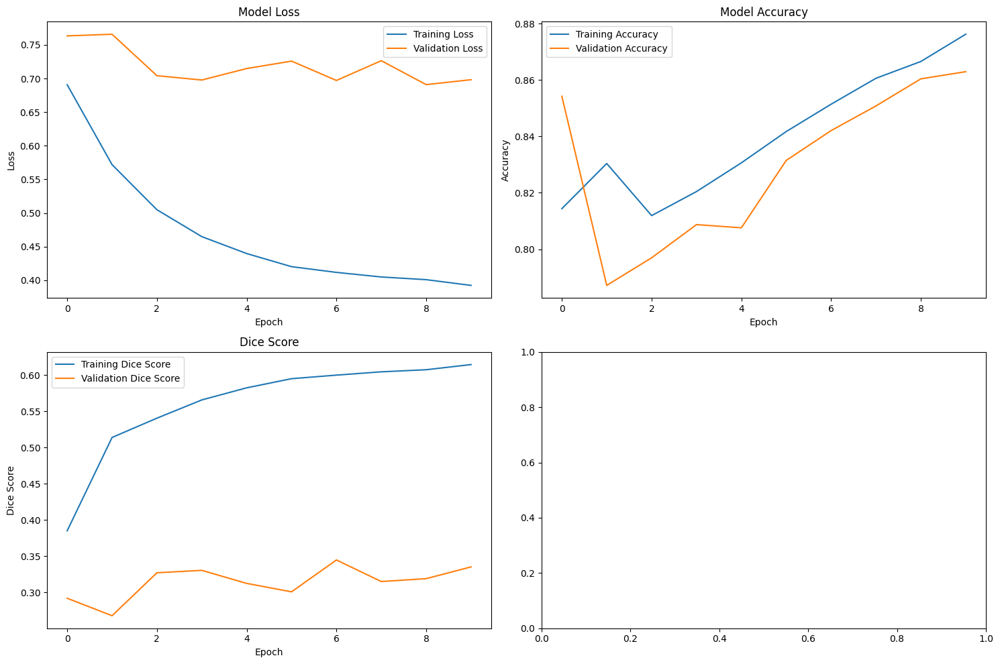

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step


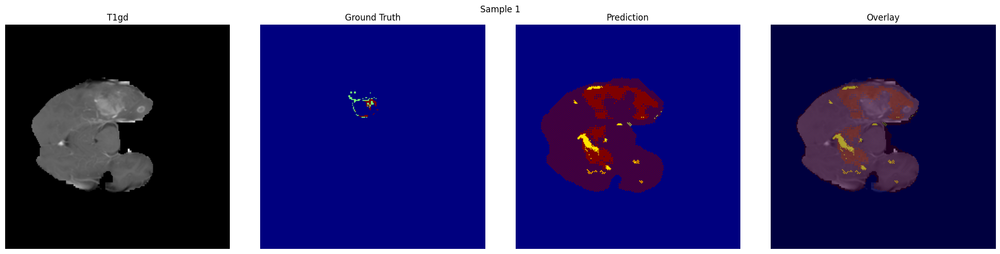

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


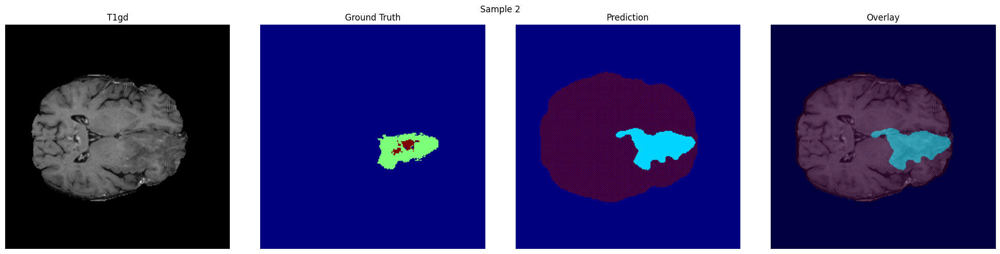

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


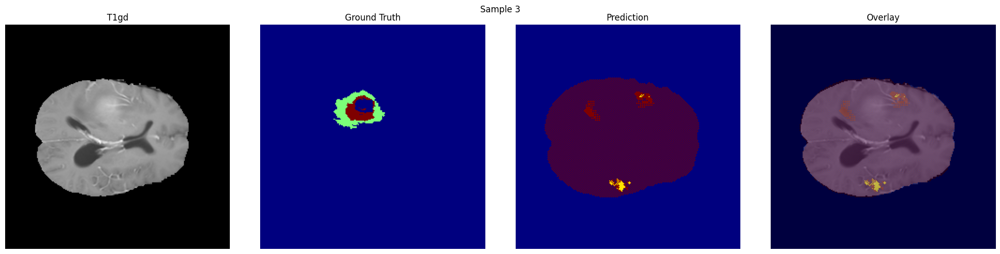

In [ ]:
model_aug_w_rotations, trainer_aug_w_rotations = main_training(
    X_balanced, y_balanced, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_aug_w_rotations.keras",
    seed=13
)

# AUGMENATION RELATIVE TO MINORITY CLASSES (Noises)

## Data Loader Class

In [ ]:
class BraTSDataLoaderDiscoveredWithTracking:
    """
    Class developed based on exploratory analysis of the BraTS dataset.
    Tracks patient ID and slice index for each image.
    """

    def __init__(self, data_path, img_size=(240, 240)):
        # Fix the path if needed
        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path

        self.img_size = img_size


    def load_nifti_file(self, filepath):
        """Load and normalize NIfTI files based on dataset analysis."""
        nifti_img = nib.load(filepath)
        data = nifti_img.get_fdata()

        # Normalize data if standard deviation is non-zero
        if data.std() != 0:
            data = (data - data.mean()) / data.std()

        return data

    def extract_meaningful_slices_with_info(self, image_4d, mask, patient_id):
        """
        Extract only the slices that contain tumor annotations.
        Keep track of patient and slice index information.
        """
        modalities = {
            'FLAIR': image_4d[:, :, :, 0],
            'T1w': image_4d[:, :, :, 1],
            'T1gd': image_4d[:, :, :, 2],
            'T2w': image_4d[:, :, :, 3]
        }

        # Combine modalities into a single volume (H, W, Z, Channels)
        volume = np.stack([
            modalities['FLAIR'],
            modalities['T1w'],
            modalities['T1gd'],
            modalities['T2w']
        ], axis=-1)

        slices_data = []
        slices_masks = []
        slice_info = []

        for z in range(volume.shape[2]):  # Loop through slices along Z-axis
            slice_mask = mask[:, :, z]
            if np.sum(slice_mask) > 0:  # Process only non-empty masks
                slice_img = volume[:, :, z, :]

                # Resize the image and mask to the target size
                slice_img_resized = tf.image.resize(slice_img, self.img_size).numpy()
                slice_mask_resized = tf.image.resize(
                    np.expand_dims(slice_mask, -1),
                    self.img_size,
                    method='nearest'  # Preserve label values
                ).numpy().squeeze()

                slices_data.append(slice_img_resized)
                slices_masks.append(slice_mask_resized)

                # Store metadata about the slice
                slice_info.append({
                    'patient_id': patient_id,
                    'original_slice_idx': z,
                    'total_slices': volume.shape[2],
                    'tumor_pixels': np.sum(slice_mask > 0)
                })

        return np.array(slices_data), np.array(slices_masks), slice_info

    def process_discovered_dataset_with_tracking(self, patients_to_process= patients_to_process):
        """
        Process the dataset using the discovered insights.
        Keep track of which patient and slice each image comes from.
        """
        cases_to_process = patients_to_process.copy()

        all_images = []
        all_masks = []
        all_slice_info = []

        for i, case in enumerate(cases_to_process):
            patient_id = os.path.basename(case['image']).replace('.nii.gz', '')
            print(f"\nProcessing case {i+1}/{len(cases_to_process)}: {patient_id}")

            try:
                # Clean the image path
                image_relative_path = case['image'].lstrip('./')
                image_path = os.path.join(self.data_path, image_relative_path)

                if not os.path.exists(image_path):
                    print(f"   Image file not found: {image_path}")
                    continue

                # Load the 4D image volume
                image_4d = self.load_nifti_file(image_path)

                # Clean the mask path
                label_relative_path = case['label'].lstrip('./')
                mask_path = os.path.join(self.data_path, label_relative_path)

                if not os.path.exists(mask_path):
                    print(f"   Mask file not found: {mask_path}")
                    continue

                # Load and preprocess the mask
                mask = nib.load(mask_path).get_fdata()
                processed_mask = preprocess_mask(mask)

                # Extract meaningful slices and metadata
                slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_info(
                    image_4d, processed_mask, patient_id
                )

                print(f"Extracted {len(slices_data)} useful slices")

                all_images.extend(slices_data)
                all_masks.extend(slices_masks)
                all_slice_info.extend(slice_info)

            except Exception as e:
                print(f" Error: {e}")
                continue

        all_images = np.array(all_images)
        all_masks = np.array(all_masks)

        # Show distribution of slices per patient
        from collections import Counter
        patients = [info['patient_id'] for info in all_slice_info]
        patient_counts = Counter(patients)

        return all_images, all_masks, all_slice_info

## Loader in Action


Processing case 1/10: BRATS_037
Extracted 73 useful slices

Processing case 2/10: BRATS_046
Extracted 77 useful slices

Processing case 3/10: BRATS_056
Extracted 81 useful slices

Processing case 4/10: BRATS_096
Extracted 70 useful slices

Processing case 5/10: BRATS_108
Extracted 81 useful slices

Processing case 6/10: BRATS_130
Extracted 54 useful slices

Processing case 7/10: BRATS_137
Extracted 74 useful slices

Processing case 8/10: BRATS_178
Extracted 74 useful slices

Processing case 9/10: BRATS_207
Extracted 81 useful slices

Processing case 10/10: BRATS_315
Extracted 51 useful slices

---------------------
Visualize a specific brain slice after preprocessing
Patient: BRATS_108
Index in the processed dataset: 358/716


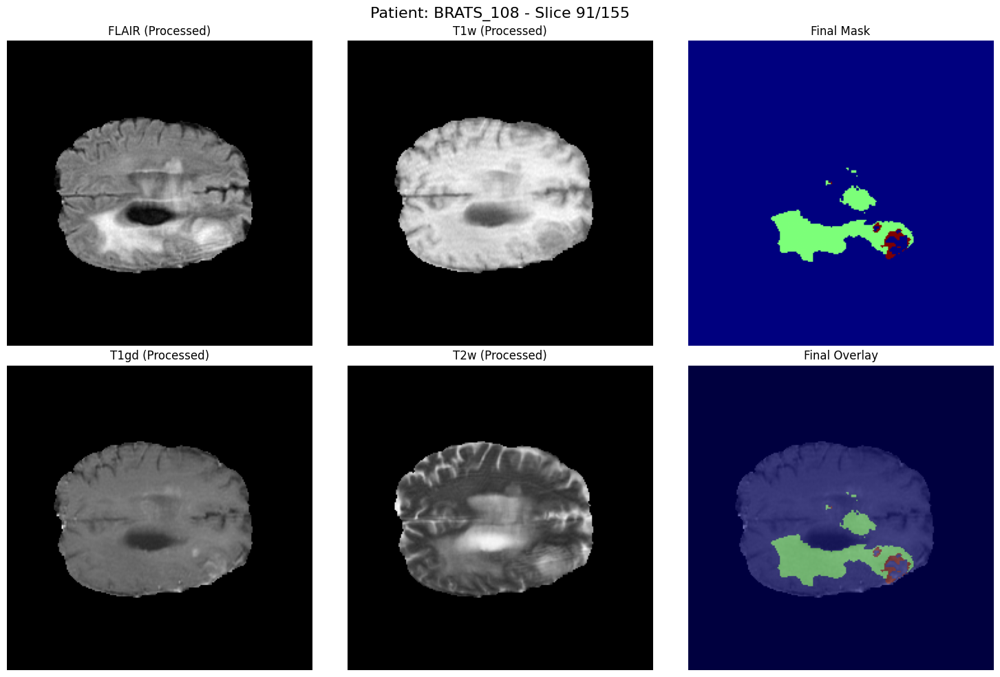


==== BASIC ====
Training set - pixel per class:
  Class 0: 33,374,999 pixel (97.9%)
  Class 1: 606,849 pixel (1.8%)
  Class 2: 117,352 pixel (0.3%)
Validation set - pixel per class:
  Class 0: 7,059,112 pixel (98.8%)
  Class 1: 69,111 pixel (1.0%)
  Class 2: 14,177 pixel (0.2%)


In [ ]:
if 'dataset_config' in locals() and dataset_config:

    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    loader_with_tracking = BraTSDataLoaderDiscoveredWithTracking(correct_data_path)

    final_images, final_masks, slice_info = loader_with_tracking.process_discovered_dataset_with_tracking()

    if len(final_images) > 0:
        X_train, y_train, X_val, y_val, train_slice_info, val_slice_info = split_and_analyze_dataset(
            final_images,
            final_masks,
            slice_info,
            test_size=0.2,
            seed=13,
            label="Basic",
            visualize=True
        )
    else:
        print("No data processed correctly.")



## AUGMENTATION




In [19]:
def analyze_class_distribution(y_train, title="Dataset"):
    """
    Print the number and percentage of pixels for each class in the dataset.
    """
    print(f"\nClass distribution - {title}")

    flat = y_train.flatten().astype(int)
    unique_classes, counts = np.unique(flat, return_counts=True)

    total = len(flat)
    for cls, count in zip(unique_classes, counts):
        pct = (count / total) * 100
        print(f"Class {cls}: {count:,} pixels ({pct:.2f}%)")

    return unique_classes, counts

def identify_minority_slices(y_train, train_slice_info, minority_threshold=0.05):
    """
    Find slices that have a high amount of minority classes, i.e. less than 30% of total pixels (excluding background).
    Only slices with >5% of any minority class are considered for augmentation.
    """
    flat = y_train.flatten().astype(int)
    global_unique, global_counts = np.unique(flat, return_counts=True)
    total = len(flat)

    # Find minority classes (excluding class 0)
    minority_classes = [cls for cls, cnt in zip(global_unique, global_counts)
                        if cls != 0 and (cnt / total) < 0.3]

    candidates = []
    details = []

    for i in range(len(y_train)):
        mask = y_train[i]
        unique, counts = np.unique(mask.flatten(), return_counts=True)
        total_pixels = mask.size

        percentages = {cls: cnt / total_pixels for cls, cnt in zip(unique, counts)}

        minority_content = 0
        present_minority = []

        for cls in minority_classes:
            if cls in percentages and percentages[cls] >= minority_threshold:
                minority_content += percentages[cls]
                present_minority.append(cls)

        info = {
            'slice_idx': i,
            'patient_id': train_slice_info[i]['patient_id'],
            'minority_content': minority_content,
            'minority_classes': present_minority,
            'class_percentages': percentages
        }

        details.append(info)

        if minority_content > 0:
            candidates.append(i)

    print(f"\nTotal slices: {len(y_train)}")
    print(f"Slices with minority classes: {len(candidates)}")

    return candidates, details

def add_gaussian_noise(image, noise_factor=0.1):
    """
    Add Gaussian noise to the image. Works with single or multi-channel.
    """
    if len(image.shape) == 3:
        noisy = image.copy()
        for c in range(image.shape[2]):
            channel = image[:, :, c]
            noise = np.random.normal(0, noise_factor * np.std(channel), channel.shape)
            noisy[:, :, c] = channel + noise
        return np.clip(noisy, np.min(image), np.max(image))
    else:
        noise = np.random.normal(0, noise_factor * np.std(image), image.shape)
        return np.clip(image + noise, np.min(image), np.max(image))

def adjust_brightness(image, factor_range=(-0.2, 0.2)):
    """
    Adjust image brightness randomly. Works with single or multi-channel.
    """
    if len(image.shape) == 3:
        bright = image.copy()
        for c in range(image.shape[2]):
            factor = np.random.uniform(*factor_range)
            bright[:, :, c] += factor * np.std(image[:, :, c])
        return np.clip(bright, np.min(image), np.max(image))
    else:
        factor = np.random.uniform(*factor_range)
        return np.clip(image + factor * np.std(image), np.min(image), np.max(image))

def adjust_contrast(image, factor_range=(0.8, 1.2)):
    """
    Randomly adjust image contrast. Works with single or multi-channel.
    """
    if len(image.shape) == 3:
        contrast = image.copy()
        for c in range(image.shape[2]):
            mean_val = np.mean(image[:, :, c])
            factor = np.random.uniform(*factor_range)
            contrast[:, :, c] = mean_val + factor * (image[:, :, c] - mean_val)
        return np.clip(contrast, np.min(image), np.max(image))
    else:
        mean_val = np.mean(image)
        factor = np.random.uniform(*factor_range)
        return np.clip(mean_val + factor * (image - mean_val), np.min(image), np.max(image))

def gamma_correction(image, gamma_range=(0.8, 1.2)):
    """
    Apply gamma correction. Works with single or multi-channel.
    """
    gamma = np.random.uniform(*gamma_range)
    if len(image.shape) == 3:
        corrected = image.copy()
        for c in range(image.shape[2]):
            channel = image[:, :, c]
            norm = (channel - np.min(channel)) / (np.max(channel) - np.min(channel) + 1e-8)
            corrected[:, :, c] = norm**gamma * (np.max(channel) - np.min(channel)) + np.min(channel)
        return corrected
    else:
        norm = (image - np.min(image)) / (np.max(image) - np.min(image) + 1e-8)
        return norm**gamma * (np.max(image) - np.min(image)) + np.min(image)

def gaussian_blur(image, sigma_range=(0.5, 1.5)):
    """
    Apply Gaussian blur. Works with single or multi-channel.
    """
    sigma = np.random.uniform(*sigma_range)
    if len(image.shape) == 3:
        blurred = image.copy()
        for c in range(image.shape[2]):
            blurred[:, :, c] = gaussian_filter(image[:, :, c], sigma)
        return blurred
    else:
        return gaussian_filter(image, sigma)

def elastic_deformation(image, mask, alpha=10, sigma=3):
    """
    Apply elastic deformation to image and mask. Works with single or multi-channel.
    """
    shape = image.shape[:2]
    dx = gaussian_filter((np.random.rand(*shape) * 2 - 1), sigma) * alpha
    dy = gaussian_filter((np.random.rand(*shape) * 2 - 1), sigma) * alpha
    y, x = np.meshgrid(np.arange(shape[0]), np.arange(shape[1]), indexing='ij')
    indices = np.reshape(y + dy, (-1, 1)), np.reshape(x + dx, (-1, 1))

    if len(image.shape) == 3:
        deformed = np.zeros_like(image)
        for c in range(image.shape[2]):
            deformed[:, :, c] = ndimage.map_coordinates(image[:, :, c], indices, order=1, mode='reflect').reshape(shape)
    else:
        deformed = ndimage.map_coordinates(image, indices, order=1, mode='reflect').reshape(shape)

    deformed_mask = ndimage.map_coordinates(mask, indices, order=0, mode='reflect').reshape(mask.shape)
    return deformed, deformed_mask.astype(mask.dtype)

def intensity_scaling(image, scale_range=(0.9, 1.1)):
    """
    Scale image intensities randomly. Works with single or multi-channel.
    """
    if len(image.shape) == 3:
        scaled = image.copy()
        for c in range(image.shape[2]):
            scale = np.random.uniform(*scale_range)
            scaled[:, :, c] = image[:, :, c] * scale
        return scaled
    else:
        scale = np.random.uniform(*scale_range)
        return image * scale

def apply_noise_augmentation_transforms(image, mask):
    """
    Apply multiple data augmentation transforms to an image-mask pair.
    Returns a list of (augmented_image, augmented_mask, transformation_name).
    """
    results = []

    results.append((add_gaussian_noise(image.copy(), 0.05), mask.copy(), "gaussian_noise"))
    results.append((adjust_brightness(image.copy(), (-0.15, 0.15)), mask.copy(), "brightness_adjust"))
    results.append((adjust_contrast(image.copy(), (0.85, 1.15)), mask.copy(), "contrast_adjust"))
    results.append((gamma_correction(image.copy(), (0.85, 1.15)), mask.copy(), "gamma_correction"))
    results.append((gaussian_blur(image.copy(), (0.3, 0.8)), mask.copy(), "gaussian_blur"))

    img_elastic, mask_elastic = elastic_deformation(image.copy(), mask.copy(), alpha=8, sigma=2)
    results.append((img_elastic, mask_elastic, "elastic_deform"))

    results.append((intensity_scaling(image.copy(), (0.95, 1.05)), mask.copy(), "intensity_scaling"))

    combo1 = adjust_contrast(add_gaussian_noise(image.copy(), 0.03), (0.9, 1.1))
    results.append((combo1, mask.copy(), "noise_contrast_combo"))

    combo2 = adjust_brightness(gamma_correction(image.copy(), (0.9, 1.1)), (-0.1, 0.1))
    results.append((combo2, mask.copy(), "gamma_brightness_combo"))

    return results

def selective_noise_augmentation(X_train, y_train, train_slice_info,
                           minority_threshold=0.05,
                           max_augmentations_per_slice=4,
                           prioritize_high_content=True):
    """
    Apply selective augmentation only on slices with significant minority class content.
    """
    candidates, details = identify_minority_slices(y_train, train_slice_info, minority_threshold)

    if not candidates:
        return X_train, y_train, train_slice_info

    if prioritize_high_content:
        filtered = [d for d in details if d['slice_idx'] in candidates]
        filtered.sort(key=lambda x: x['minority_content'], reverse=True)
        candidates = [d['slice_idx'] for d in filtered]

    augmented_images = []
    augmented_masks = []
    augmented_info = []

    for idx in candidates:
        image = X_train[idx]
        mask = y_train[idx]
        aug_pairs = apply_noise_augmentation_transforms(image, mask)

        # Randomly select up to max_augmentations_per_slice
        selected = random.sample(aug_pairs, min(max_augmentations_per_slice, len(aug_pairs)))

        for img_aug, mask_aug, name in selected:
            augmented_images.append(img_aug)
            augmented_masks.append(mask_aug)
            augmented_info.append({
                'patient_id': train_slice_info[idx]['patient_id'],
                'origin_slice_idx': idx,
                'augmentation_type': name
            })

    # Concatenate original and augmented data
    X_all = np.concatenate([X_train, np.stack(augmented_images)], axis=0)
    y_all = np.concatenate([y_train, np.stack(augmented_masks)], axis=0)
    info_all = train_slice_info + augmented_info

    print(f"\nAugmented dataset size: {len(X_all)} (original: {len(X_train)}, augmented: {len(augmented_images)})")

    return X_all, y_all, info_all

def balance_with_noise_augmentation(X_train, y_train, train_slice_info,
                                       minority_threshold=0.05,
                                       max_augmentations=6,
                                       show_stats=True,
                                       visualize_example=False):
    """
    Balance dataset by augmenting slices with underrepresented classes.
    """
    print("Dataset balancing with selective augmentation")

    if show_stats:
        analyze_class_distribution(y_train, "ORIGINAL")

    X_balanced, y_balanced, balanced_info = selective_noise_augmentation(
        X_train, y_train, train_slice_info,
        minority_threshold=minority_threshold,
        max_augmentations_per_slice=max_augmentations,
        prioritize_high_content=True
    )

    if show_stats:
        analyze_class_distribution(y_balanced, "AUGMENTED")

    return X_balanced, y_balanced, balanced_info

In [ ]:
# Using the function
X_balanced, y_balanced, balanced_info = balance_with_noise_augmentation(
    X_train, y_train, train_slice_info,
    minority_threshold=0.05,  # threshold for minority classes
    max_augmentations=4, # max augmentations per slice
    show_stats=True,
    visualize_example=False
)

Dataset balancing with selective augmentation

Class distribution - ORIGINAL
Class 0: 33,374,999 pixels (97.88%)
Class 1: 606,849 pixels (1.78%)
Class 2: 117,352 pixels (0.34%)

Total slices: 592
Slices with minority classes: 24

Augmented dataset size: 688 (original: 592, augmented: 96)

Class distribution - AUGMENTED
Class 0: 38,538,762 pixels (97.25%)
Class 1: 910,155 pixels (2.30%)
Class 2: 179,883 pixels (0.45%)


## Training Function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_38 (Conv2D)  │ (None, 240, 240,  │      2,368 │ input_layer_2[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_38[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_36       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_39 (Conv2D)  │ (None, 240, 240,  │     36,928 │ activation_36[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_39[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_37       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_8     │ (None, 120, 120,  │          0 │ activation_37[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_40 (Conv2D)  │ (None, 120, 120,  │     73,856 │ max_pooling2d_8[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_40[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_38       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_41 (Conv2D)  │ (None, 120, 120,  │    147,584 │ activation_38[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_41[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_39       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_9     │ (None, 60, 60,    │          0 │ activation_39[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_42 (Conv2D)  │ (None, 60, 60,    │    295,168 │ max_pooling2d_9[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_42[0][0] 

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 88s 427ms/step - accuracy: 0.8064 - dice_score: 0.3292 - loss: 0.7511 - val_accuracy: 0.9482 - val_dice_score: 0.3321 - val_loss: 0.7482 - learning_rate: 1.0000e-04
Epoch 2/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 74s 431ms/step - accuracy: 0.9610 - dice_score: 0.4909 - loss: 0.6217 - val_accuracy: 0.9483 - val_dice_score: 0.3586 - val_loss: 0.7083 - learning_rate: 1.0000e-04
Epoch 3/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 68s 395ms/step - accuracy: 0.9679 - dice_score: 0.5502 - loss: 0.5473 - val_accuracy: 0.9403 - val_dice_score: 0.3539 - val_loss: 0.6913 - learning_rate: 1.0000e-04
Epoch 4/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 82s 397ms/step - accuracy: 0.9737 - dice_score: 0.5832 - loss: 0.4830 - val_accuracy: 0.9237 - val_dice_score: 0.3451 - val_loss: 0.6896 - learning_rate: 1.0000e-04
Epoch 5/10
172/172 ━━━━━━━━━━━━━━━━━━━━ 82s 396ms/step - accuracy: 0.9750 - dice_score: 0.6069 - loss: 0.4371 - val_accuracy: 0.9462 - val_dice_score: 0.3067 - val_loss: 0.7273 - l

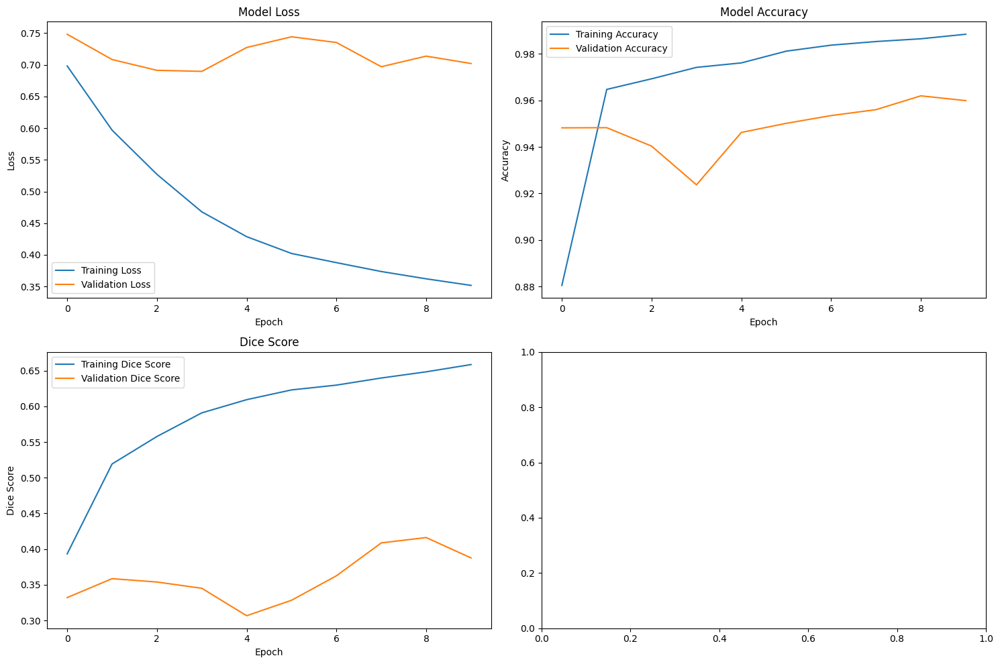

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 637ms/step


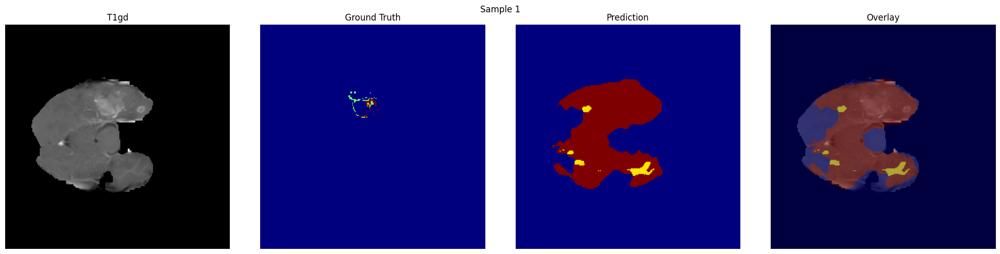

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step


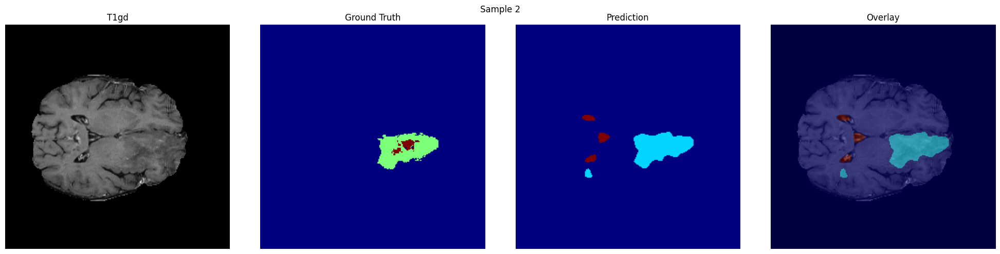

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step


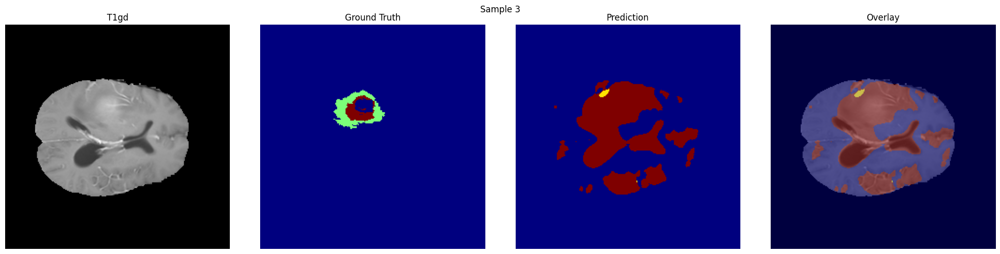

In [ ]:
model_aug_w_noise, trainer_aug_w_noise = main_training(
    X_balanced, y_balanced, X_val, y_val,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_aug_w_noise.keras",
    seed=13
)

# MODALITIES COMBINATION




## Data Loader class




In [20]:
class BraTSDataLoaderUnified:
    """
    Unified class for preprocessing BraTS dataset
    """

    def __init__(self,
                 data_path,
                 img_size=(240, 240),
                 enable_cropping=True,
                 crop_margin=2,
                 normalization_method='z_score',
                 crop_method='otsu'):

        if data_path.endswith('Task01_BrainTumour') and not data_path.endswith('Task01_BrainTumour/Task01_BrainTumour'):
            self.data_path = os.path.join(data_path, "Task01_BrainTumour")
        else:
            self.data_path = data_path


        self.img_size = img_size
        self.enable_cropping = enable_cropping
        self.crop_margin = crop_margin
        self.normalization_method = normalization_method
        self.crop_method = crop_method


        if enable_cropping:
            print(f"   Margin: {crop_margin} pixel")
            print(f"   Method: {crop_method}")


    def find_brain_bbox(self, image_volume, method='otsu'):
        """
        Robust management of brain cropping
        """
        t1w_volume = image_volume[:, :, :, 1]

        # Brain mask summing all slices
        brain_mask = np.zeros(t1w_volume.shape[:2], dtype=bool)

        for z in range(t1w_volume.shape[2]):
            slice_img = t1w_volume[:, :, z]

            # Check if slice has content
            if slice_img.max() == 0 or slice_img.std() < 1e-6:
                continue

            slice_mask = np.zeros_like(slice_img, dtype=bool)

            if method == 'otsu':
                try:
                    from skimage.filters import threshold_otsu
                    thresh = threshold_otsu(slice_img[slice_img > 0])
                    slice_mask = (slice_img > thresh)
                except ImportError:
                    # Fallback: statistic threshold
                    thresh = slice_img.mean() + slice_img.std()
                    slice_mask = (slice_img > thresh)
                except ValueError:
                    # Fallback if otsu failed
                    thresh = slice_img.mean() + slice_img.std()
                    slice_mask = (slice_img > thresh)

            elif method == 'threshold':
                thresh = slice_img.mean() + 0.5 * slice_img.std()
                slice_mask = (slice_img > thresh)

            elif method == 'combined':
                thresh1 = slice_img.mean() + 0.3 * slice_img.std()
                mask1 = (slice_img > thresh1)

                try:
                    from skimage.filters import threshold_otsu
                    thresh2 = threshold_otsu(slice_img[slice_img > 0])
                    mask2 = (slice_img > thresh2)
                except:
                    mask2 = mask1.copy()

                slice_mask = np.logical_or(mask1, mask2)

            brain_mask = np.logical_or(brain_mask, slice_mask)

        # Case management when brain isn't found
        coords = np.where(brain_mask)
        if len(coords[0]) > 0:
            min_x, max_x = coords[1].min(), coords[1].max()
            min_y, max_y = coords[0].min(), coords[0].max()
        else:
            # Fallback: uses the complete image
            min_x, max_x = 0, brain_mask.shape[1] - 1
            min_y, max_y = 0, brain_mask.shape[0] - 1

        return min_x, max_x, min_y, max_y

    def apply_brain_crop(self, image_slice, mask_slice, bbox):
        """Apply cropping to a single slice with better checking"""
        min_x, max_x, min_y, max_y = bbox

        # Add margin with limit controls
        height, width = image_slice.shape[:2]
        min_x = max(0, min_x - self.crop_margin)
        max_x = min(width - 1, max_x + self.crop_margin)
        min_y = max(0, min_y - self.crop_margin)
        max_y = min(height - 1, max_y + self.crop_margin)

        # Check validation of the coordinates
        if min_x >= max_x or min_y >= max_y:
            return image_slice, mask_slice, (0, width-1, 0, height-1)

        # Cropping
        cropped_image = image_slice[min_y:max_y+1, min_x:max_x+1, :]
        cropped_mask = mask_slice[min_y:max_y+1, min_x:max_x+1]

        return cropped_image, cropped_mask, (min_x, max_x, min_y, max_y)

    def normalize_modality(self, data, modality_name, method='z_score'):
        """Robust normalization"""
        # Mask creation for foreground
        foreground_mask = data > 0

        if not np.any(foreground_mask):
            return data.astype(np.float32)

        foreground_data = data[foreground_mask]

        # Initialization of the result array
        data_normalized = np.zeros_like(data, dtype=np.float32)

        if method == 'z_score':
            if foreground_data.std() > 1e-8:  # New threshold
                mean_val = foreground_data.mean()
                std_val = foreground_data.std()
                data_normalized[foreground_mask] = (foreground_data - mean_val) / std_val
            else:
                data_normalized[foreground_mask] = foreground_data - foreground_data.mean()

        return data_normalized

    def load_and_preprocess_nifti(self, filepath):
        """Robust loading of NIfTI files"""
        try:
            nifti_img = nib.load(filepath)
            data = nifti_img.get_fdata()

            # Check 4 modes
            if data.shape[-1] != 4:
                raise ValueError(f"Needed 4 modes")

        except Exception as e:
            raise

        # Modes separation
        modalities = {
            'FLAIR': data[:, :, :, 0],
            'T1w': data[:, :, :, 1],
            'T1gd': data[:, :, :, 2],
            'T2w': data[:, :, :, 3]
        }

        # Normalization per mode
        normalized_modalities = {}
        for modality_name, modality_data in modalities.items():
            normalized_data = self.normalize_modality(
                modality_data, modality_name, self.normalization_method
            )
            normalized_modalities[modality_name] = normalized_data

        normalized_volume = np.stack([
            normalized_modalities['FLAIR'],
            normalized_modalities['T1w'],
            normalized_modalities['T1gd'],
            normalized_modalities['T2w']
        ], axis=-1)

        return normalized_volume.astype(np.float32)


    def extract_meaningful_slices_with_full_info(self, image_4d, mask, patient_id):
        """
        Robust slice extraction
        """
        volume = image_4d

        # Brain cropping
        if self.enable_cropping:
            try:
                brain_bbox = self.find_brain_bbox(volume, self.crop_method)
            except Exception as e:
                brain_bbox = None
                self.enable_cropping = False
        else:
            brain_bbox = None

        slices_data = []
        slices_masks = []
        slice_info = []


        for z in range(volume.shape[2]):
            slice_mask = mask[:, :, z]

            # Only slice with at least some pixels of tumour
            if np.sum(slice_mask) > 0:  # Minimum threshold for tumor pixel
                slice_img = volume[:, :, z, :]

                try:
                    # Apply brain cropping
                    if self.enable_cropping and brain_bbox is not None:
                        slice_img_cropped, slice_mask_cropped, actual_bbox = self.apply_brain_crop(
                            slice_img, slice_mask, brain_bbox
                        )
                        crop_info = {
                            'original_size': slice_img.shape[:2],
                            'cropped_size': slice_img_cropped.shape[:2],
                            'bbox_used': actual_bbox,
                            'reduction_factor': (slice_img_cropped.shape[0] * slice_img_cropped.shape[1]) /
                                              (slice_img.shape[0] * slice_img.shape[1])
                        }
                    else:
                        slice_img_cropped = slice_img
                        slice_mask_cropped = slice_mask
                        crop_info = {
                            'original_size': slice_img.shape[:2],
                            'cropped_size': slice_img.shape[:2],
                            'bbox_used': None,
                            'reduction_factor': 1.0
                        }

                    # Robust resize
                    if slice_img_cropped.shape[0] > 0 and slice_img_cropped.shape[1] > 0:
                        slice_img_resized = tf.image.resize(
                            slice_img_cropped,
                            self.img_size,
                            method='bilinear'
                        ).numpy().astype(np.float32)

                        slice_mask_resized = tf.image.resize(
                            np.expand_dims(slice_mask_cropped, -1),
                            self.img_size,
                            method='nearest'
                        ).numpy().squeeze().astype(np.uint8)

                        slices_data.append(slice_img_resized)
                        slices_masks.append(slice_mask_resized)

                        # Completed info
                        slice_info.append({
                            'patient_id': patient_id,
                            'original_slice_idx': z,
                            'total_slices': volume.shape[2],
                            'tumor_pixels': np.sum(slice_mask > 0),
                            'crop_info': crop_info,
                            'normalization_method': self.normalization_method
                        })

                except Exception as e:
                    continue


        if len(slices_data) == 0:
            return np.array([]), np.array([]), []

        return np.array(slices_data), np.array(slices_masks), slice_info

    def process_dataset(self, patients_to_process = patients_to_process, verbose = True):

      cases_to_process = patients_to_process.copy()

      if verbose:
        print(f"   Cases to process: {len(cases_to_process)}")
        print(f"   Brain cropping: {'Yes' if self.enable_cropping else 'No'}")
        print(f"   Normalization: {self.normalization_method}")

      all_images = []
      all_masks = []
      all_slice_info = []


      for i, case in enumerate(cases_to_process):
          patient_id = os.path.basename(case['image']).replace('.nii.gz', '')


          if verbose:
              print(f"\n Case {i+1}/{len(cases_to_process)}: {patient_id}")

          try:
              # Correct paths
              image_path = os.path.join(self.data_path, case['image'].lstrip('./'))
              mask_path = os.path.join(self.data_path, case['label'].lstrip('./'))

              if not os.path.exists(image_path):
                continue

              if not os.path.exists(mask_path):
                  continue

              # Upload and preprocess
              image_4d = self.load_and_preprocess_nifti(image_path)
              mask = nib.load(mask_path).get_fdata()
              processed_mask = preprocess_mask(mask)

              # Estract slice
              slices_data, slices_masks, slice_info = self.extract_meaningful_slices_with_full_info(
                  image_4d, processed_mask, patient_id
              )

              if len(slices_data) > 0:
                  if verbose:
                      print(f" {len(slices_data)} slices extracted")
                      if self.enable_cropping and len(slice_info) > 0:
                          avg_reduction = np.mean([s['crop_info']['reduction_factor'] for s in slice_info])
                          print(f"  Average background reduction: {(1-avg_reduction)*100:.1f}%")

                  all_images.extend(slices_data)
                  all_masks.extend(slices_masks)
                  all_slice_info.extend(slice_info)

          except Exception as e:
              continue

      if len(all_images) == 0:
          return np.array([]), np.array([]), []

      all_images = np.array(all_images)
      all_masks = np.array(all_masks)

      return all_images, all_masks, all_slice_info

## Loader in Action

   Margin: 2 pixel
   Method: otsu
   Cases to process: 10
   Brain cropping: Yes
   Normalization: z_score

 Case 1/10: BRATS_037
 73 slices extracted
  Average background reduction: 60.8%

 Case 2/10: BRATS_046
 77 slices extracted
  Average background reduction: 62.1%

 Case 3/10: BRATS_056
 81 slices extracted
  Average background reduction: 63.7%

 Case 4/10: BRATS_096
 70 slices extracted
  Average background reduction: 63.2%

 Case 5/10: BRATS_108
 81 slices extracted
  Average background reduction: 58.9%

 Case 6/10: BRATS_130
 54 slices extracted
  Average background reduction: 58.3%

 Case 7/10: BRATS_137
 74 slices extracted
  Average background reduction: 59.1%

 Case 8/10: BRATS_178
 74 slices extracted
  Average background reduction: 59.9%

 Case 9/10: BRATS_207
 81 slices extracted
  Average background reduction: 61.9%

 Case 10/10: BRATS_315
 51 slices extracted
  Average background reduction: 64.6%

---------------------
Visualize a specific brain slice after preproces

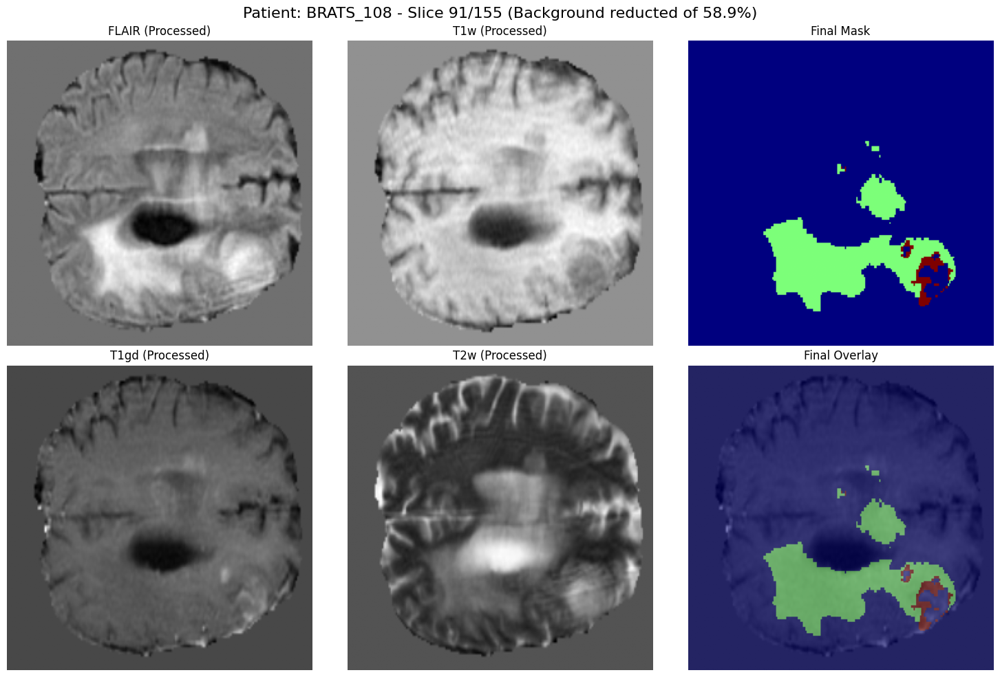


==== BASIC ====
Training set - pixel per class:
  Class 0: 32,225,238 pixel (94.5%)
  Class 1: 1,573,859 pixel (4.6%)
  Class 2: 300,103 pixel (0.9%)
Validation set - pixel per class:
  Class 0: 6,934,789 pixel (97.1%)
  Class 1: 171,101 pixel (2.4%)
  Class 2: 36,510 pixel (0.5%)
Training set - background average reduction: 61.2%
Validation set - background average reduction: 61.0%


In [21]:
if 'dataset_config' in locals() and dataset_config:

    correct_data_path = "/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour"

    loader_with_tracking = BraTSDataLoaderUnified(correct_data_path)

    final_images, final_masks, slice_info = loader_with_tracking.process_dataset()

    if len(final_images) > 0:
        X_train, y_train, X_val_combined, y_val_combined, train_slice_info, val_slice_info = split_and_analyze_dataset(
            final_images,
            final_masks,
            slice_info,
            test_size=0.2,
            seed=13,
            label="Basic",
            visualize=True
        )
    else:
        print("No data processed correctly.")


## AUGMENTATION




In [22]:
# Using the previous function
X_train_combined, y_train_combined, combined_info = balance_with_noise_augmentation(
    X_train, y_train, train_slice_info,
    minority_threshold=0.05,  # threshold for minority classes
    max_augmentations=4, # max augmentations per slice
    show_stats=True,
    visualize_example=False
)

Dataset balancing with selective augmentation

Class distribution - ORIGINAL
Class 0: 32,225,238 pixels (94.50%)
Class 1: 1,573,859 pixels (4.62%)
Class 2: 300,103 pixels (0.88%)

Total slices: 592
Slices with minority classes: 231

Augmented dataset size: 1516 (original: 592, augmented: 924)

Class distribution - AUGMENTED
Class 0: 79,729,969 pixels (91.31%)
Class 1: 6,508,736 pixels (7.45%)
Class 2: 1,082,895 pixels (1.24%)


## Training Function

Model: "UNet2D"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_19 (Conv2D)  │ (None, 240, 240,  │      2,368 │ input_layer_1[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_19[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_18       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_20 (Conv2D)  │ (None, 240, 240,  │     36,928 │ activation_18[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_20[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_19       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_4     │ (None, 120, 120,  │          0 │ activation_19[0]… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_21 (Conv2D)  │ (None, 120, 120,  │     73,856 │ max_pooling2d_4[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_21[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_20       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_22 (Conv2D)  │ (None, 120, 120,  │    147,584 │ activation_20[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_22[0][0]   │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_21       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_5     │ (None, 60, 60,    │          0 │ activation_21[0]… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_23 (Conv2D)  │ (None, 60, 60,    │    295,168 │ max_pooling2d_5[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_23[0][0] 

 Total params: 31,056,068 (118.47 MB)

 Trainable params: 31,044,292 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 203s 492ms/step - accuracy: 0.8270 - dice_score: 0.4663 - loss: 0.6092 - val_accuracy: 0.9284 - val_dice_score: 0.3954 - val_loss: 0.6703 - learning_rate: 1.0000e-04
Epoch 2/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 160s 381ms/step - accuracy: 0.9070 - dice_score: 0.6073 - loss: 0.4275 - val_accuracy: 0.9596 - val_dice_score: 0.3915 - val_loss: 0.6500 - learning_rate: 1.0000e-04
Epoch 3/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 225s 442ms/step - accuracy: 0.9545 - dice_score: 0.6373 - loss: 0.3787 - val_accuracy: 0.9763 - val_dice_score: 0.4639 - val_loss: 0.6521 - learning_rate: 1.0000e-04
Epoch 4/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 205s 450ms/step - accuracy: 0.9766 - dice_score: 0.6543 - loss: 0.3544 - val_accuracy: 0.9733 - val_dice_score: 0.4681 - val_loss: 0.6559 - learning_rate: 1.0000e-04
Epoch 5/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 147s 389ms/step - accuracy: 0.9814 - dice_score: 0.6621 - loss: 0.3432 - val_accuracy: 0.9730 - val_dice_score: 0.4535 - val_loss: 0.660

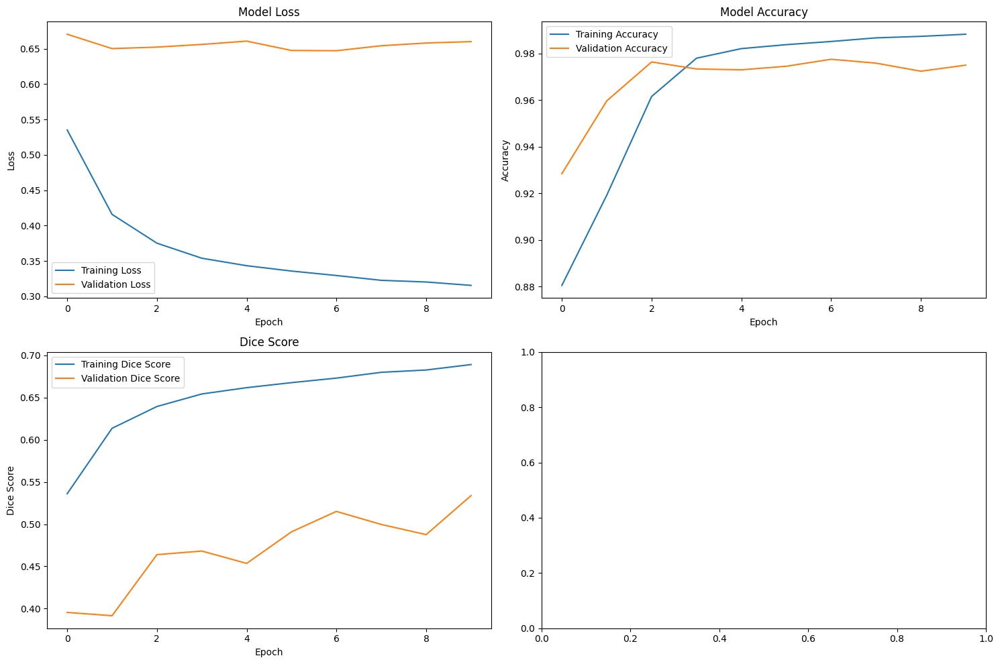

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step


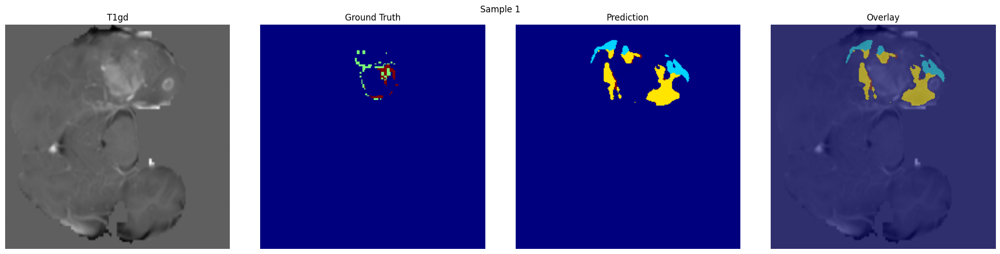

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step


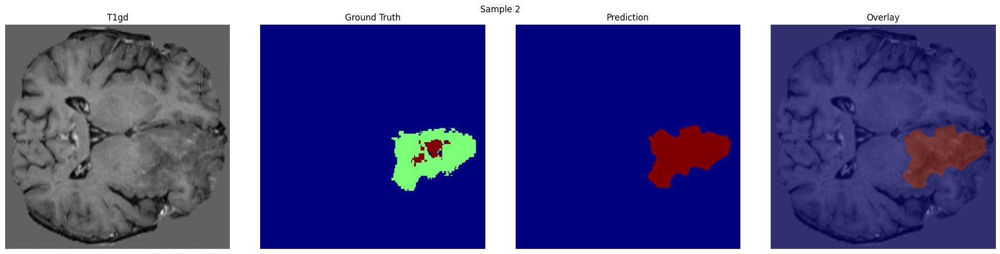

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step


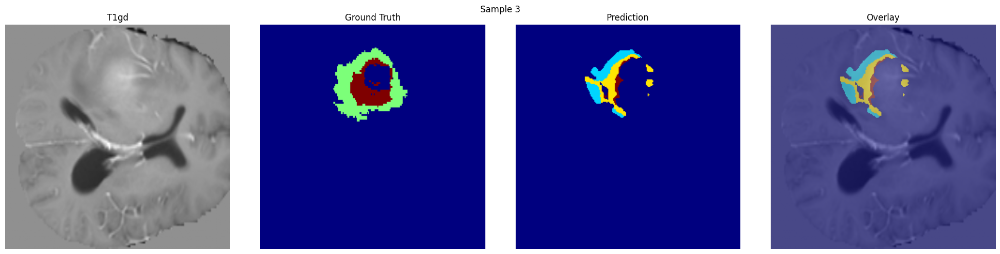

In [ ]:
model_combined, trainer_combined = main_training(
    X_train_combined, y_train_combined, X_val_combined, y_val_combined,
    model_class=UNet2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_combined.keras",
    seed=13
)

# Different U-Nets

### First Declination



In [ ]:
class UNetAttention2D:
    def __init__(self, input_shape=(240, 240, 4), num_classes=4):
        self.input_shape = input_shape
        self.num_classes = num_classes

    def conv_block(self, inputs, filters, kernel_size=3, activation='relu'):
        """Standard convolutional block"""
        x = layers.Conv2D(filters, kernel_size, padding='same')(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Activation(activation)(x)
        x = layers.Conv2D(filters, kernel_size, padding='same')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation(activation)(x)
        return x

    def attention_gate(self, gating_signal, skip_connection, filters):
        """
        Attention Gate tends to improve skip connections, focus on most important features
        """
        # Gating signal upsampling to match dimensions of skip connections
        g = layers.Conv2D(filters, 1, padding='same')(gating_signal)
        g = layers.BatchNormalization()(g)
        g = layers.UpSampling2D(size=(2, 2), interpolation='bilinear')(g)

        # Resize the skip connection
        x = layers.Conv2D(filters, 1, padding='same')(skip_connection)
        x = layers.BatchNormalization()(x)

        # Combine signals
        combined = layers.Add()([g, x])
        combined = layers.Activation('relu')(combined)

        # Generate attention weights
        attention = layers.Conv2D(1, 1, padding='same')(combined)
        attention = layers.BatchNormalization()(attention)
        attention = layers.Activation('sigmoid')(attention)

        # Apply attention to the skip connection
        attended_features = layers.Multiply()([skip_connection, attention])

        return attended_features

    def encoder_block(self, inputs, filters):
        conv = self.conv_block(inputs, filters)
        pool = layers.MaxPooling2D(pool_size=(2, 2))(conv)
        return conv, pool

    def decoder_block(self, inputs, skip_features, filters):
        # Apply attention gate using inputs as gating signal
        skip_features = self.attention_gate(inputs, skip_features, filters)

        # Upsampling
        upconv = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(inputs)

        # Concatenate and apply convolution
        concat = layers.Concatenate()([upconv, skip_features])
        conv = self.conv_block(concat, filters)
        return conv

    def build_model(self):
        inputs = layers.Input(shape=self.input_shape)

        # Encoder
        s1, p1 = self.encoder_block(inputs, 64)
        s2, p2 = self.encoder_block(p1, 128)
        s3, p3 = self.encoder_block(p2, 256)
        s4, p4 = self.encoder_block(p3, 512)

        # Bottleneck
        bottleneck = self.conv_block(p4, 1024)

        # Decoder with Attention Gates
        d1 = self.decoder_block(bottleneck, s4, 512)
        d2 = self.decoder_block(d1, s3, 256)
        d3 = self.decoder_block(d2, s2, 128)
        d4 = self.decoder_block(d3, s1, 64)

        outputs = layers.Conv2D(self.num_classes, 1, activation='softmax')(d4)

        model_Attention = keras.Model(inputs, outputs, name='UNet2D_Attention')
        return model_Attention


#### Training Function




Model: "UNet2D_Attention"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 240, 240,  │      2,368 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 240, 240,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 240, 240,  │     36,928 │ activation[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 120, 120,  │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 120, 120,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 120, 120,  │    147,584 │ activation_2[0][… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 60, 60,    │          0 │ activation_3[0][… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 60, 60,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 60, 60,    │      1,024 │ conv2d_4[0][0]  

 Total params: 32,111,128 (122.49 MB)

 Trainable params: 32,095,504 (122.43 MB)

 Non-trainable params: 15,624 (61.03 KB)

Epoch 1/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 212s 491ms/step - accuracy: 0.8898 - dice_score: 0.4935 - loss: 0.6086 - val_accuracy: 0.9835 - val_dice_score: 0.5109 - val_loss: 0.6610 - learning_rate: 1.0000e-04
Epoch 2/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 186s 456ms/step - accuracy: 0.9740 - dice_score: 0.7747 - loss: 0.4295 - val_accuracy: 0.9804 - val_dice_score: 0.6637 - val_loss: 0.6337 - learning_rate: 1.0000e-04
Epoch 3/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 197s 443ms/step - accuracy: 0.9802 - dice_score: 0.8922 - loss: 0.3756 - val_accuracy: 0.9809 - val_dice_score: 0.6583 - val_loss: 0.6390 - learning_rate: 1.0000e-04
Epoch 4/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 202s 444ms/step - accuracy: 0.9826 - dice_score: 0.9059 - loss: 0.3533 - val_accuracy: 0.9810 - val_dice_score: 0.6337 - val_loss: 0.6594 - learning_rate: 1.0000e-04
Epoch 5/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 202s 444ms/step - accuracy: 0.9843 - dice_score: 0.9145 - loss: 0.3410 - val_accuracy: 0.9753 - val_dice_score: 0.6343 - val_loss: 0.650

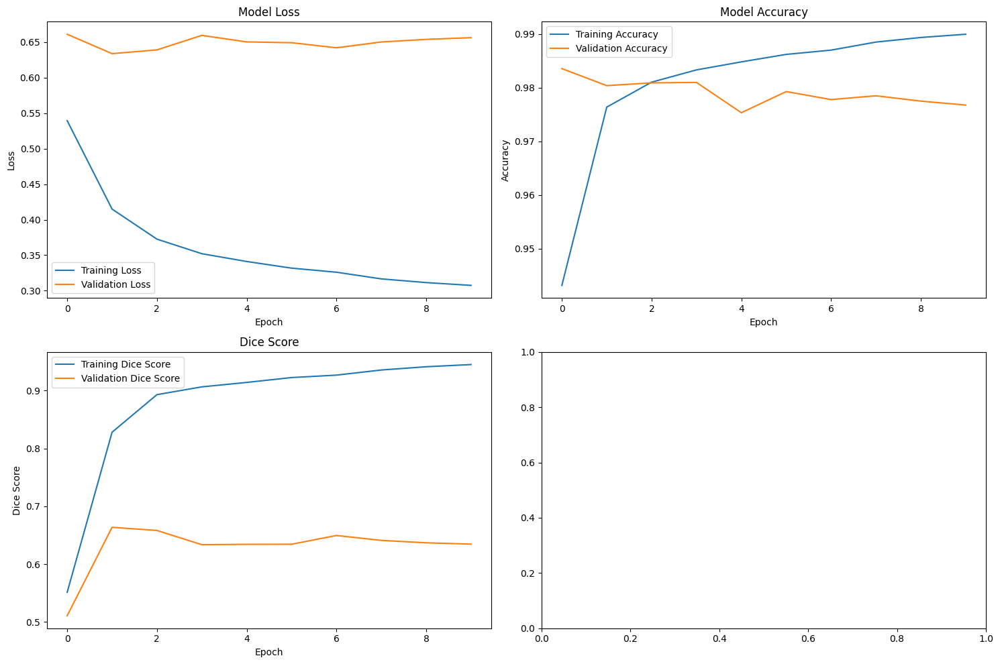

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


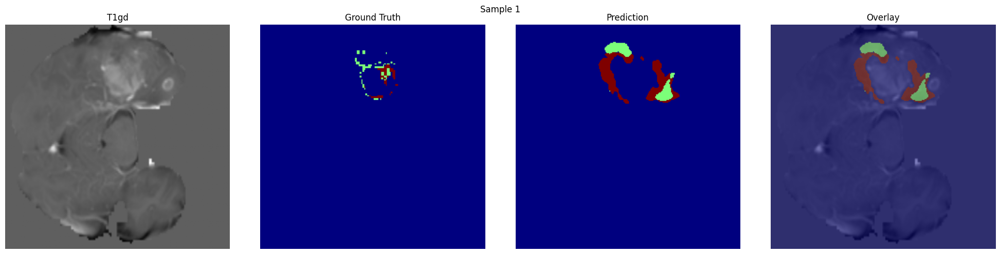

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step


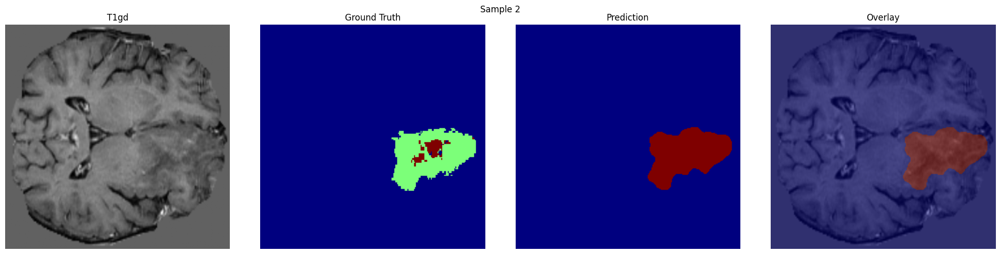

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step


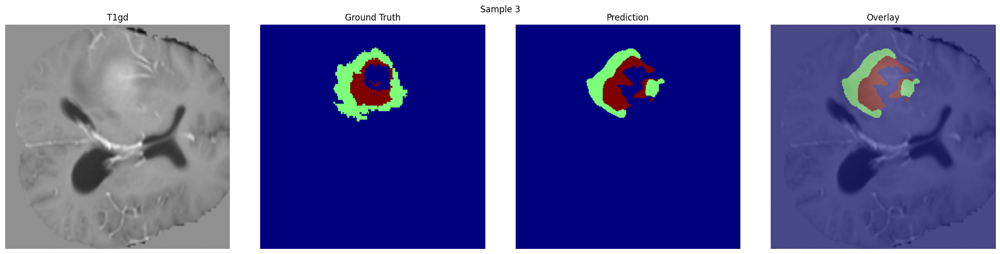

In [ ]:
model_Attention_combined, trainer_Attention_combined = main_training(
    X_train_combined, y_train_combined, X_val_combined, y_val_combined,
    model_class=UNetAttention2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4},
    model_name="model_Attention_combined.keras",
    seed=13
)


### Second Declination

In [ ]:
# U-Net with Residual Connections and Dropout
class UNetResidual2D:
    def __init__(self, input_shape=(240, 240, 4), num_classes=4, dropout_rate=0.3):
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.dropout_rate = dropout_rate

    def residual_conv_block(self, inputs, filters, kernel_size=3, activation='relu'):
        """
        Convolutional block with residual connections and dropout
        """
        x = layers.Conv2D(filters, kernel_size, padding='same')(inputs)
        x = layers.BatchNormalization()(x)
        x = layers.Activation(activation)(x)
        x = layers.Dropout(self.dropout_rate)(x)

        x = layers.Conv2D(filters, kernel_size, padding='same')(x)
        x = layers.BatchNormalization()(x)

        # Residual connection
        # If the number of channels is different, adjust with a 1x1 convolution
        if inputs.shape[-1] != filters:
            shortcut = layers.Conv2D(filters, 1, padding='same')(inputs)
        else:
            shortcut = inputs

        # Residual sum
        x = layers.Add()([x, shortcut])
        x = layers.Activation(activation)(x)
        x = layers.Dropout(self.dropout_rate)(x)

        return x

    def encoder_block(self, inputs, filters):
        conv = self.residual_conv_block(inputs, filters)
        pool = layers.MaxPooling2D(pool_size=(2, 2))(conv)
        return conv, pool

    def decoder_block(self, inputs, skip_features, filters):
        upconv = layers.Conv2DTranspose(filters, (2, 2), strides=2, padding='same')(inputs)
        concat = layers.Concatenate()([upconv, skip_features])
        conv = self.residual_conv_block(concat, filters)
        return conv

    def build_model(self):
        inputs = layers.Input(shape=self.input_shape)

        # Encoder with residual blocks
        s1, p1 = self.encoder_block(inputs, 64)
        s2, p2 = self.encoder_block(p1, 128)
        s3, p3 = self.encoder_block(p2, 256)
        s4, p4 = self.encoder_block(p3, 512)

        # Bottleneck with higher dropout
        bottleneck = layers.Conv2D(1024, 3, padding='same')(p4)
        bottleneck = layers.BatchNormalization()(bottleneck)
        bottleneck = layers.Activation('relu')(bottleneck)
        bottleneck = layers.Dropout(0.5)(bottleneck)
        bottleneck = layers.Conv2D(1024, 3, padding='same')(bottleneck)
        bottleneck = layers.BatchNormalization()(bottleneck)
        bottleneck = layers.Activation('relu')(bottleneck)
        bottleneck = layers.Dropout(0.5)(bottleneck)

        # Decoder with residual blocks
        d1 = self.decoder_block(bottleneck, s4, 512)
        d2 = self.decoder_block(d1, s3, 256)
        d3 = self.decoder_block(d2, s2, 128)
        d4 = self.decoder_block(d3, s1, 64)

        outputs = layers.Conv2D(self.num_classes, 1, activation='softmax')(d4)

        model_Res = keras.Model(inputs, outputs, name='UNet2D_Residual')
        return model_Res

#### Training Function




Model: "UNet2D_Residual"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 240, 240,  │          0 │ -                 │
│ (InputLayer)        │ 4)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_112 (Conv2D) │ (None, 240, 240,  │      2,368 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_112[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_80       │ (None, 240, 240,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_54          │ (None, 240, 240,  │          0 │ activation_80[0]… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_113 (Conv2D) │ (None, 240, 240,  │     36,928 │ dropout_54[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 240, 240,  │        256 │ conv2d_113[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_114 (Conv2D) │ (None, 240, 240,  │        320 │ input_layer_4[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_28 (Add)        │ (None, 240, 240,  │          0 │ batch_normalizat… │
│                     │ 64)               │            │ conv2d_114[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_81       │ (None, 240, 240,  │          0 │ add_28[0][0]      │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_55          │ (None, 240, 240,  │          0 │ activation_81[0]… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 120, 120,  │          0 │ dropout_55[0][0]  │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_115 (Conv2D) │ (None, 120, 120,  │     73,856 │ max_pooling2d_16… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 120, 120,  │        512 │ conv2d_115[0][0]  │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_82       │ (None, 120, 120,  │          0 │ batch_normalizat… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_56          │ (None, 120, 120,  │          0 │ activation_82[0]… │
│ (Dropout)           │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_116 (Conv2D) │ (None, 120, 120,  │    147,584 │ dropout_56[0][0]

 Total params: 31,926,596 (121.79 MB)

 Trainable params: 31,914,820 (121.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

Epoch 1/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 212s 511ms/step - accuracy: 0.9322 - dice_score: 0.4904 - loss: 0.5241 - val_accuracy: 0.9732 - val_dice_score: 0.5883 - val_loss: 0.7013 - learning_rate: 1.0000e-04
Epoch 2/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 176s 465ms/step - accuracy: 0.9721 - dice_score: 0.6356 - loss: 0.3959 - val_accuracy: 0.9744 - val_dice_score: 0.5774 - val_loss: 0.7123 - learning_rate: 1.0000e-04
Epoch 3/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 201s 464ms/step - accuracy: 0.9757 - dice_score: 0.6943 - loss: 0.3796 - val_accuracy: 0.9713 - val_dice_score: 0.5442 - val_loss: 0.7372 - learning_rate: 1.0000e-04
Epoch 4/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 202s 464ms/step - accuracy: 0.9783 - dice_score: 0.7620 - loss: 0.3679 - val_accuracy: 0.9716 - val_dice_score: 0.5558 - val_loss: 0.7311 - learning_rate: 1.0000e-04
Epoch 5/10
379/379 ━━━━━━━━━━━━━━━━━━━━ 203s 466ms/step - accuracy: 0.9801 - dice_score: 0.7782 - loss: 0.3595 - val_accuracy: 0.9713 - val_dice_score: 0.5462 - val_loss: 0.735

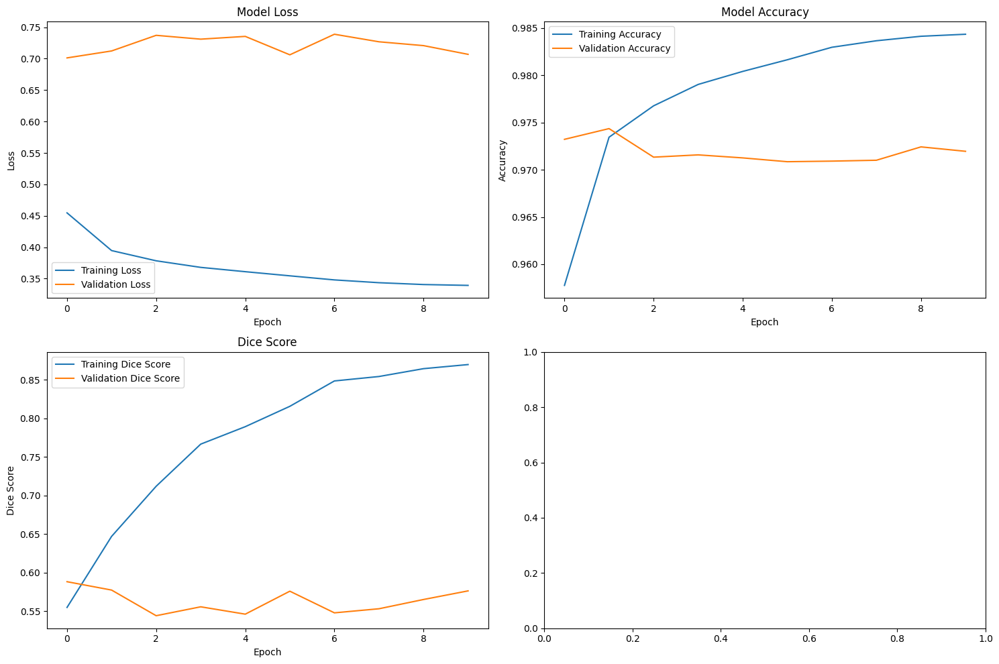

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


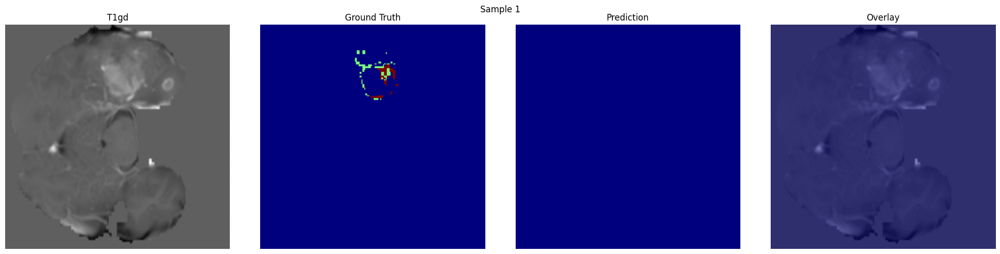

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


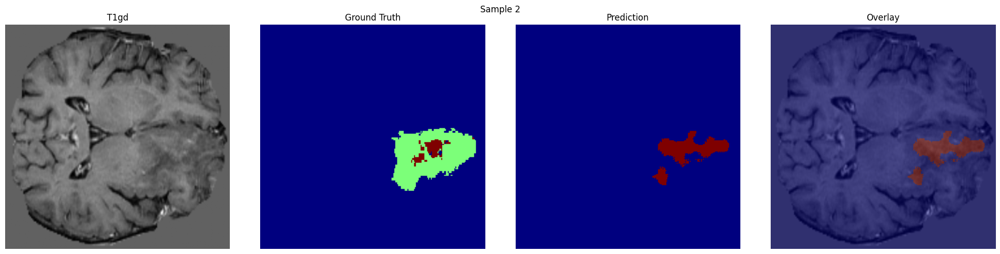

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step


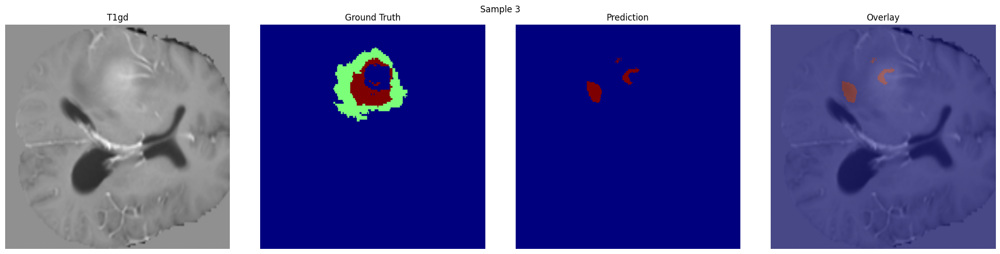

In [ ]:
model_Res_combined, trainer_Res_combined = main_training(
    X_train_combined, y_train_combined, X_val_combined, y_val_combined,
    model_class=UNetResidual2D,
    model_kwargs={'input_shape': (240, 240, 4), 'num_classes': 4, 'dropout_rate': 0.3},
    model_name="model_Res_combined.keras",
    seed=13
)

# TEST

## Model Loading

## DiceLoss

In [24]:
class DiceLoss(keras.losses.Loss):
    """Dice Loss implementation for segmentation tasks"""

    def __init__(self, smooth=1e-6, reduction=keras.losses.Reduction.AUTO, name='dice_loss'):
        # Call the parent class constructor with reduction and name
        super().__init__(reduction=reduction, name=name)
        # Add a small smoothing factor to avoid division by zero
        self.smooth = smooth

    def call(self, y_true, y_pred):
        """
        Computes the Dice Loss between the ground truth and predicted masks.
        Returns Dice loss
        """

        # Convert ground truth labels to one-hot format (shape: [batch, height, width, 4])
        y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=4)

        # Flatten both the ground truth and predicted masks to shape: [total_pixels, 4]
        y_true_flat = tf.reshape(y_true_one_hot, [-1, 4])
        y_pred_flat = tf.reshape(y_pred, [-1, 4])

        # Compute the intersection for each class (element-wise multiplication and sum)
        intersection = tf.reduce_sum(y_true_flat * y_pred_flat, axis=0)

        # Compute the union for each class (sum of both masks)
        union = tf.reduce_sum(y_true_flat, axis=0) + tf.reduce_sum(y_pred_flat, axis=0)

        # Calculate Dice coefficient for each class using the formula
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)

        # Dice loss is 1 - mean Dice coefficient across all classes
        return 1.0 - tf.reduce_mean(dice)

    def get_config(self):
        """Return the configuration of the loss function for serialization"""
        config = super().get_config()
        config.update({
            'smooth': self.smooth,
        })
        return config

class DiceScore(keras.metrics.Metric):
    """Dice Score metric for segmentation tasks"""

    def __init__(self, smooth=1e-6, name='dice_score', **kwargs):
        super().__init__(name=name, **kwargs)
        self.smooth = smooth
        self.total_dice = self.add_weight(name='total_dice', initializer='zeros')
        self.count = self.add_weight(name='count', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Convert ground truth labels to one-hot format
        y_true_one_hot = tf.keras.utils.to_categorical(y_true, num_classes=4)

        # Flatten both masks
        y_true_flat = tf.reshape(y_true_one_hot, [-1, 4])
        y_pred_flat = tf.reshape(y_pred, [-1, 4])

        # Compute intersection and union
        intersection = tf.reduce_sum(y_true_flat * y_pred_flat, axis=0)
        union = tf.reduce_sum(y_true_flat, axis=0) + tf.reduce_sum(y_pred_flat, axis=0)

        # Calculate Dice coefficient
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        mean_dice = tf.reduce_mean(dice)

        self.total_dice.assign_add(mean_dice)
        self.count.assign_add(1.0)

    def result(self):
        return self.total_dice / self.count

    def reset_state(self):
        self.total_dice.assign(0.0)
        self.count.assign(0.0)

    def get_config(self):
        config = super().get_config()
        config.update({
            'smooth': self.smooth,
        })
        return config

## Model Loading

In [31]:
def load_model_ignore_optimizer_warnings(model_path):
    """
    Load the model ignoring optimizer warnings
    """
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        custom_objects = {
            'DiceLoss': DiceLoss,
            'DiceScore': DiceScore
        }

        model = keras.models.load_model(model_path, custom_objects=custom_objects)

        return model

model_combined=load_model_ignore_optimizer_warnings('/content/drive/MyDrive/model_combined.keras')
model_Res_combined=load_model_ignore_optimizer_warnings('/content/drive/MyDrive/model_Res_combined.keras')
model_Attention_combined=load_model_ignore_optimizer_warnings('/content/drive/MyDrive/model_Attention_combined.keras')


## Preprocessing


In [28]:
class BraTSTestProcessor:
    """
    Class to process single test slices using the same preprocessing as training
    Adapted to be consistent with BraTSDataLoaderUnified
    """

    def __init__(self, img_size=(240, 240), normalization_method='z_score'):
        self.img_size = img_size
        self.normalization_method = normalization_method

        print(f" BraTS Test Processor")
        print(f" Target dimension: {img_size}")
        print(f" Normalization: {normalization_method}")

    def normalize_modality(self, data, modality_name, method='z_score'):
        """Robust normalization - IDENTICAL to training"""
        # Foreground mask
        foreground_mask = data > 0

        if not np.any(foreground_mask):
            return data.astype(np.float32)

        foreground_data = data[foreground_mask]

        # Initialize output array
        data_normalized = np.zeros_like(data, dtype=np.float32)

        if method == 'z_score':
            if foreground_data.std() > 1e-8:  # Same threshold as training
                mean_val = foreground_data.mean()
                std_val = foreground_data.std()
                data_normalized[foreground_mask] = (foreground_data - mean_val) / std_val
            else:
                data_normalized[foreground_mask] = foreground_data - foreground_data.mean()

        return data_normalized

    def load_and_preprocess_nifti(self, filepath):
        """Robust loading of NIfTI file - IDENTICAL to training"""
        try:
            nifti_img = nib.load(filepath)
            data = nifti_img.get_fdata()

            # Controllo 4 modalità
            if data.shape[-1] != 4:
                raise ValueError(f"4 modalities required, found {data.shape[-1]}")

        except Exception as e:
            raise Exception(f"Error loading {filepath}: {e}")

        # Separate modalities - IDENTICAL to training
        modalities = {
            'FLAIR': data[:, :, :, 0],
            'T1w': data[:, :, :, 1],
            'T1gd': data[:, :, :, 2],
            'T2w': data[:, :, :, 3]
        }

        # Normalize each modality - IDENTICAL to training
        normalized_modalities = {}
        for modality_name, modality_data in modalities.items():
            normalized_data = self.normalize_modality(
                modality_data, modality_name, self.normalization_method
            )
            normalized_modalities[modality_name] = normalized_data

        normalized_volume = np.stack([
            normalized_modalities['FLAIR'],
            normalized_modalities['T1w'],
            normalized_modalities['T1gd'],
            normalized_modalities['T2w']
        ], axis=-1)

        return normalized_volume.astype(np.float32)

    def process_single_slice(self, volume_4d, slice_idx):
        """
        Process a single slice
        """
        if slice_idx >= volume_4d.shape[2]:
            raise ValueError(f"Slice index {slice_idx} out of range (max: {volume_4d.shape[2]-1})")

        # Extract the slice
        slice_img = volume_4d[:, :, slice_idx, :]

        # Resize using TensorFlow (same method as training)
        if slice_img.shape[0] > 0 and slice_img.shape[1] > 0:
            slice_img_resized = tf.image.resize(
                slice_img,
                self.img_size,
                method='bilinear'
            ).numpy().astype(np.float32)
        else:
            raise ValueError("Invalid slice dimensions")

        return slice_img_resized

    def process_multiple_slices(self, volume_4d, slice_indices=None, min_tumor_pixels=0):
        """
        Process multiple slices from a volume - extension of training method
        """
        if slice_indices is None:
            # If not specified, take all slices with content
            slice_indices = range(volume_4d.shape[2])

        processed_slices = []
        valid_indices = []

        for slice_idx in slice_indices:
            try:
                slice_img = self.process_single_slice(volume_4d, slice_idx)

                # Minimum content check (similar to training)
                if np.sum(slice_img > 0) >= min_tumor_pixels:
                    processed_slices.append(slice_img)
                    valid_indices.append(slice_idx)

            except Exception as e:
                print(f"Error processing slice {slice_idx}: {e}")
                continue

        if len(processed_slices) == 0:
          return np.array([]), []

        return np.array(processed_slices), valid_indices



def create_prediction_mask(prediction, verbose=True):
  """
  Convert model prediction into a binary or multi-class mask.
  Handles multi-channel softmax outputs by taking the argmax across channels.
  """
  if prediction.ndim == 3 and prediction.shape[-1] > 1:
      # Multi-class prediction (e.g., softmax over classes)
      prediction_mask = np.argmax(prediction, axis=-1)
  elif prediction.ndim == 2:
      # Already a 2D mask
      prediction_mask = prediction
  elif prediction.ndim == 3 and prediction.shape[-1] == 1:
      # Single channel mask with shape (H, W, 1)
      prediction_mask = np.squeeze(prediction, axis=-1)
  else:
      raise ValueError(f"Unexpected prediction shape: {prediction.shape}")

  if verbose:
      unique_values = np.unique(prediction_mask)
      print(f"   Created prediction mask with shape {prediction_mask.shape}")
      print(f"   Unique values in mask: {unique_values}")

  return prediction_mask



def test_brats_slice(nifti_path, slice_idx, model, processor=None, show_results=True, verbose=True):
    """
    Test the model on a single slice of a BraTS volume
    Improved and more robust version with limited visualization
    """
    if processor is None:
        processor = BraTSTestProcessor()

    if verbose:
        print(f"\n TESTING SINGLE SLICE:")
        print(f"   File: {os.path.basename(nifti_path)}")
        print(f"   Slice: {slice_idx}")

    try:
        # Load and preprocess the full volume
        volume_4d = processor.load_and_preprocess_nifti(nifti_path)
        if verbose:
            print(f"   Volume shape: {volume_4d.shape}")

        # Process the specific slice
        processed_slice = processor.process_single_slice(volume_4d, slice_idx)
        if verbose:
            print(f"   Processed slice shape: {processed_slice.shape}")

        # Prepare model input (add batch dimension)
        model_input = np.expand_dims(processed_slice, axis=0)

        # Inference
        prediction = model.predict(model_input, verbose=0)
        if verbose:
            print(f"   Prediction shape: {prediction.shape}")
            print(f"   Prediction range: [{np.min(prediction):.4f}, {np.max(prediction):.4f}]")

        # Remove batch dimension
        prediction = np.squeeze(prediction, axis=0)

        # Create final mask
        prediction_mask = create_prediction_mask(prediction)

        if show_results:
            visualize_results_limited(processed_slice, prediction, prediction_mask, slice_idx, nifti_path)

        return {
            'processed_slice': processed_slice,
            'prediction': prediction,
            'prediction_mask': prediction_mask,
            'slice_info': {
                'slice_idx': slice_idx,
                'original_size': volume_4d.shape[:3],
                'resized_size': processor.img_size,
                'normalization_method': processor.normalization_method,
                'file_path': nifti_path
            }
        }

    except Exception as e:
        if verbose:
            print(f"   Error during test: {e}")
        return None



def visualize_results_limited(processed_slice, prediction, prediction_mask, slice_idx, nifti_path):
    """
    Visualize only 6 images: 4 modalities + 1 unified prediction + 1 overlay
    """
    import matplotlib.pyplot as plt

    # Setup figure with 2 rows and 3 columns
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle(f'BraTS Analysis - {os.path.basename(nifti_path)} - Slice {slice_idx}', fontsize=16)

    # Original modalities (4 channels) - reversed order for FLAIR and T2w
    modality_names = ['T2w', 'T1w', 'T1wCE', 'FLAIR']
    modality_indices = [3, 1, 2, 0]  # Map indices: T2w(3), T1w(1), T1wCE(2), FLAIR(0)

    # First row: first 3 modalities
    for i in range(3):
        axes[0, i].imshow(processed_slice[:, :, modality_indices[i]], cmap='gray')
        axes[0, i].set_title(f'{modality_names[i]}')
        axes[0, i].axis('off')

    # Fourth modality in second row, first column
    axes[1, 0].imshow(processed_slice[:, :, modality_indices[3]], cmap='gray')
    axes[1, 0].set_title(f'{modality_names[3]}')
    axes[1, 0].axis('off')

    # Fifth image: Unified prediction (all classes combined with jet colormap)
    # Create a unified prediction by combining all classes
    if len(prediction.shape) == 3 and prediction.shape[2] > 1:
        # If multiple classes, take argmax for dominant class
        unified_prediction = np.argmax(prediction, axis=2)
    else:
        # If single class or already unified
        unified_prediction = prediction[:, :, 0] if len(prediction.shape) == 3 else prediction

    axes[1, 1].imshow(unified_prediction, cmap='jet')
    axes[1, 1].set_title('Unified Prediction')
    axes[1, 1].axis('off')

    # Sixth image: Overlay prediction on first modality
    # Use FLAIR (channel 0) as background
    background = processed_slice[:, :, 0]

    # Create overlay
    overlay = axes[1, 2].imshow(background, cmap='gray')
    axes[1, 2].imshow(unified_prediction, cmap='jet', alpha=0.5, vmin=0, vmax=np.max(unified_prediction))
    axes[1, 2].set_title('Overlay (FLAIR + Prediction)')
    axes[1, 2].axis('off')

    plt.tight_layout()
    plt.show()


## Visualization Function

In [ ]:
def visualize_results(processed_slice, prediction, prediction_mask, slice_idx):
    """
    View test results
    """
    modality_names = ['FLAIR', 'T1w', 'T1gd', 'T2w']

    # First image: all modes
    fig1, axes1 = plt.subplots(2, 2, figsize=(12, 10))
    fig1.suptitle(f'Input mode - Slice {slice_idx}', fontsize=16)

    for i in range(4):
        row = i // 2
        col = i % 2
        axes1[row, col].imshow(processed_slice[:, :, i], cmap='gray')
        axes1[row, col].set_title(f'{modality_names[i]}')
        axes1[row, col].axis('off')

    plt.tight_layout()
    plt.show()

    # Second image: predictions
    if len(prediction.shape) == 3 and prediction.shape[-1] > 1:
        # Multi-class: show all classes
        n_classes = prediction.shape[-1]
        fig2, axes2 = plt.subplots(2, n_classes, figsize=(4*n_classes, 8))
        fig2.suptitle(f'Segmentation results - Slice {slice_idx}', fontsize=16)

        # First row: probability by class
        for i in range(n_classes):
            axes2[0, i].imshow(prediction[:, :, i], cmap='hot')
            axes2[0, i].set_title(f'Class {i} - Probability')
            axes2[0, i].axis('off')

        # Second line: overlay on T1gd
        for i in range(n_classes):
            axes2[1, i].imshow(processed_slice[:, :, 2], cmap='gray')  # T1gd
            if i > 0:
                class_mask = (prediction_mask == i).astype(float)
                if np.any(class_mask):
                    axes2[1, i].imshow(class_mask, cmap='jet', alpha=0.5)
            axes2[1, i].set_title(f'Overlay Classe {i}')
            axes2[1, i].axis('off')
    else:
        # Binary segmentation
        fig2, axes2 = plt.subplots(1, 3, figsize=(15, 5))
        fig2.suptitle(f'Segmentation Results - Slice {slice_idx}', fontsize=16)

        # Probability
        axes2[0].imshow(np.squeeze(prediction), cmap='hot')
        axes2[0].set_title('Segmentation Probability')
        axes2[0].axis('off')

        # Final mask
        axes2[1].imshow(prediction_mask, cmap='jet')
        axes2[1].set_title('Predicted Mask')
        axes2[1].axis('off')

        # Overlay on T1gd
        axes2[2].imshow(processed_slice[:, :, 2], cmap='gray')
        axes2[2].imshow(prediction_mask, cmap='jet', alpha=0.5)
        axes2[2].set_title('Overlay (T1gd + Mask)')
        axes2[2].axis('off')

    plt.tight_layout()
    plt.show()

## Test PreProcessing

In [29]:
# Initialize the processor
processor = BraTSTestProcessor(img_size=(240, 240), normalization_method='z_score')

 BraTS Test Processor
 Target dimension: (240, 240)
 Normalization: z_score


### Model Combined


 TESTING SINGLE SLICE:
   File: BRATS_492.nii.gz
   Slice: 75
   Volume shape: (240, 240, 155, 4)
   Processed slice shape: (240, 240, 4)
   Prediction shape: (1, 240, 240, 4)
   Prediction range: [0.0000, 1.0000]
   Created prediction mask with shape (240, 240)
   Unique values in mask: [0 1 2]


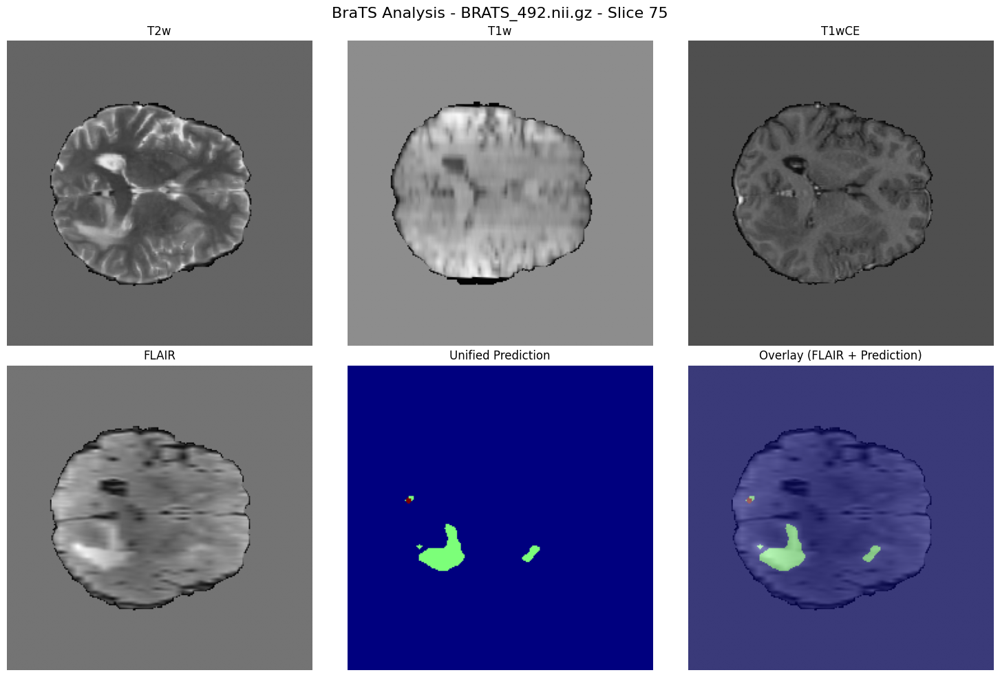

In [32]:

# Test singola slice
result = test_brats_slice(
    nifti_path='/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour/imagesTs/BRATS_492.nii.gz',
    slice_idx=75,
    model= model_combined,
    processor=processor,
    show_results=True
)

### Model Attention


 TESTING SINGLE SLICE:
   File: BRATS_492.nii.gz
   Slice: 75
   Volume shape: (240, 240, 155, 4)
   Processed slice shape: (240, 240, 4)
   Prediction shape: (1, 240, 240, 4)
   Prediction range: [0.0000, 1.0000]
   Created prediction mask with shape (240, 240)
   Unique values in mask: [0 1 2]


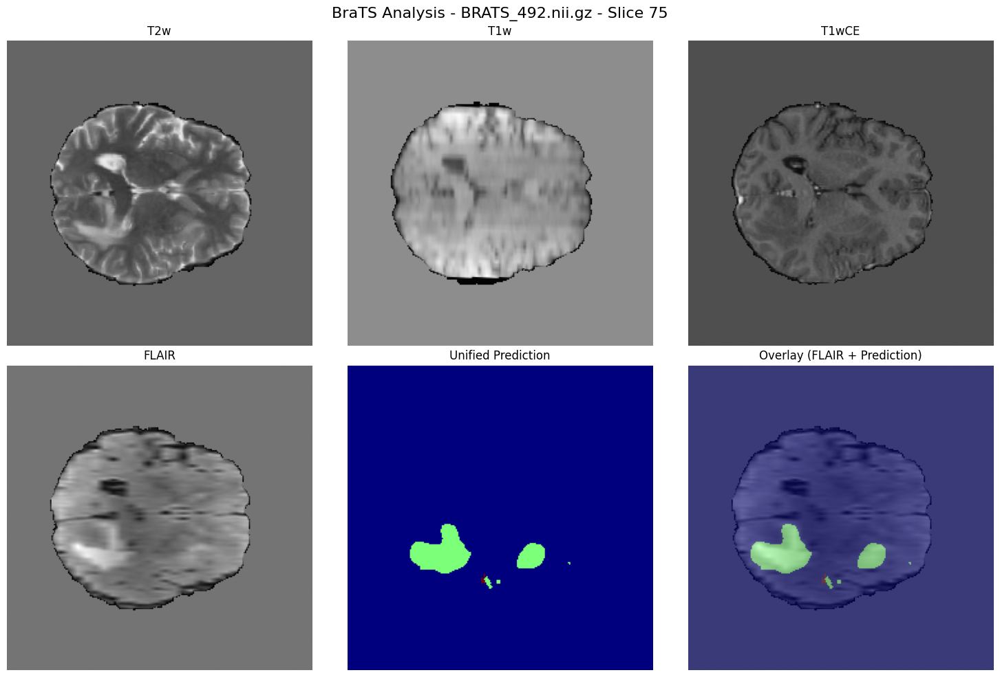

In [33]:
# Test singola slice
result = test_brats_slice(
    nifti_path='/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour/imagesTs/BRATS_492.nii.gz',
    slice_idx=75,
    model= model_Attention_combined,
    processor=processor,
    show_results=True
)

### Model Residual


 TESTING SINGLE SLICE:
   File: BRATS_492.nii.gz
   Slice: 75
   Volume shape: (240, 240, 155, 4)
   Processed slice shape: (240, 240, 4)
   Prediction shape: (1, 240, 240, 4)
   Prediction range: [0.0000, 1.0000]
   Created prediction mask with shape (240, 240)
   Unique values in mask: [0 1]


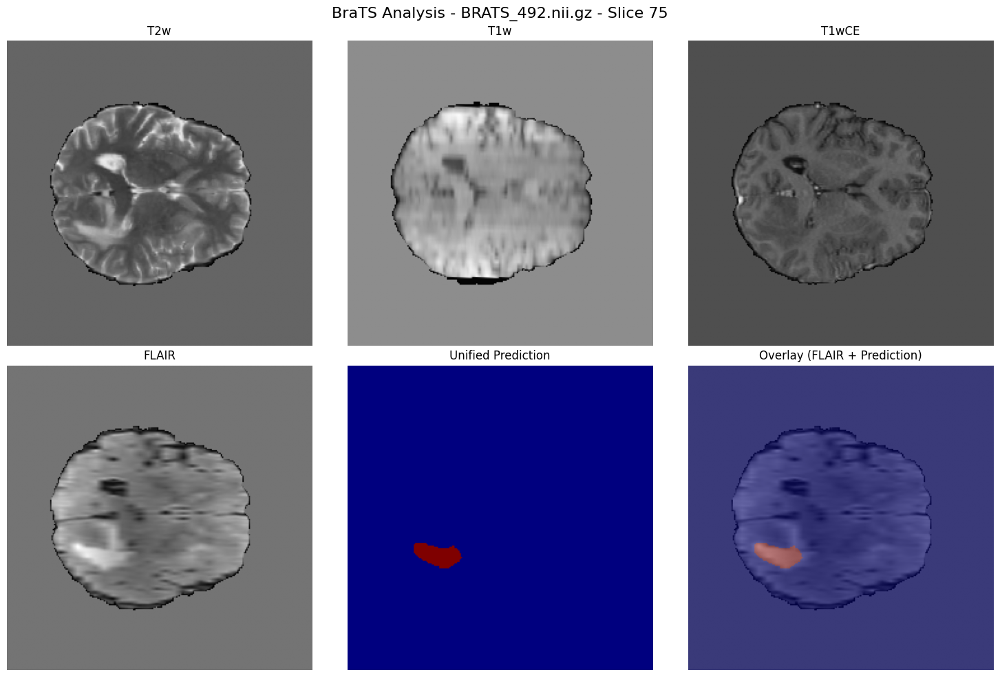

In [34]:
# Test singola slice
result = test_brats_slice(
    nifti_path='/content/drive/MyDrive/Task01_BrainTumour/Task01_BrainTumour/imagesTs/BRATS_492.nii.gz',
    slice_idx=75,
    model= model_Res_combined,
    processor=processor,
    show_results=True
)